In [1]:
import os
import time
import json

import numpy as np
import skimage

import keras
from keras.models import load_model
from keras.utils import CustomObjectScope
from keras.initializers import glorot_uniform

from dice import dice_coef, dice_loss
from predict import predict_mask
from visualize import display_slice_from_batch

Using TensorFlow backend.


In [25]:
image_path = "/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/psnr5_and_psnr100_5000_particles_setOf3_production/test__X_nonIsotropic_production_5000_3of3_PSNR100_psnr=415.841109226361800.tiff"
model_path = "oct13_largeframePSNR100_5000_48_nonzero_standardized_local.h5"
image_size = 96
patch_size = 48
batch_size = 8

In [16]:
with CustomObjectScope({'GlorotUniform': glorot_uniform()}):
        model = load_model(model_path, custom_objects={'dice': dice_loss(), 'dice_coef': dice_coef})

In [ ]:
#USE FOR NON-CUBE PREDICTIONS
#Use the overloaded predict_mask method whcih can detect the correct size
start = time.time()
mask = predict_mask(model, image_path, patch_size, offset=np.asarray([0,0,0]))
end = time.time()
print("Time to complete: " + str(end - start))

Image cropped to: 240, 480, 480


In [24]:
prediction_file = (mask*255.0).astype('uint16')
metadata = dict(microscope='joh', shape=prediction_file.shape, dtype=prediction_file.dtype.str)
metadata = json.dumps(metadata)
skimage.external.tifffile.imsave("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/psnr5_and_psnr100_5000_particles_setOf3_production/"+"Production2_PSNR100prediction.tif", prediction_file, description=metadata)    

<Figure size 2160x2160 with 0 Axes>

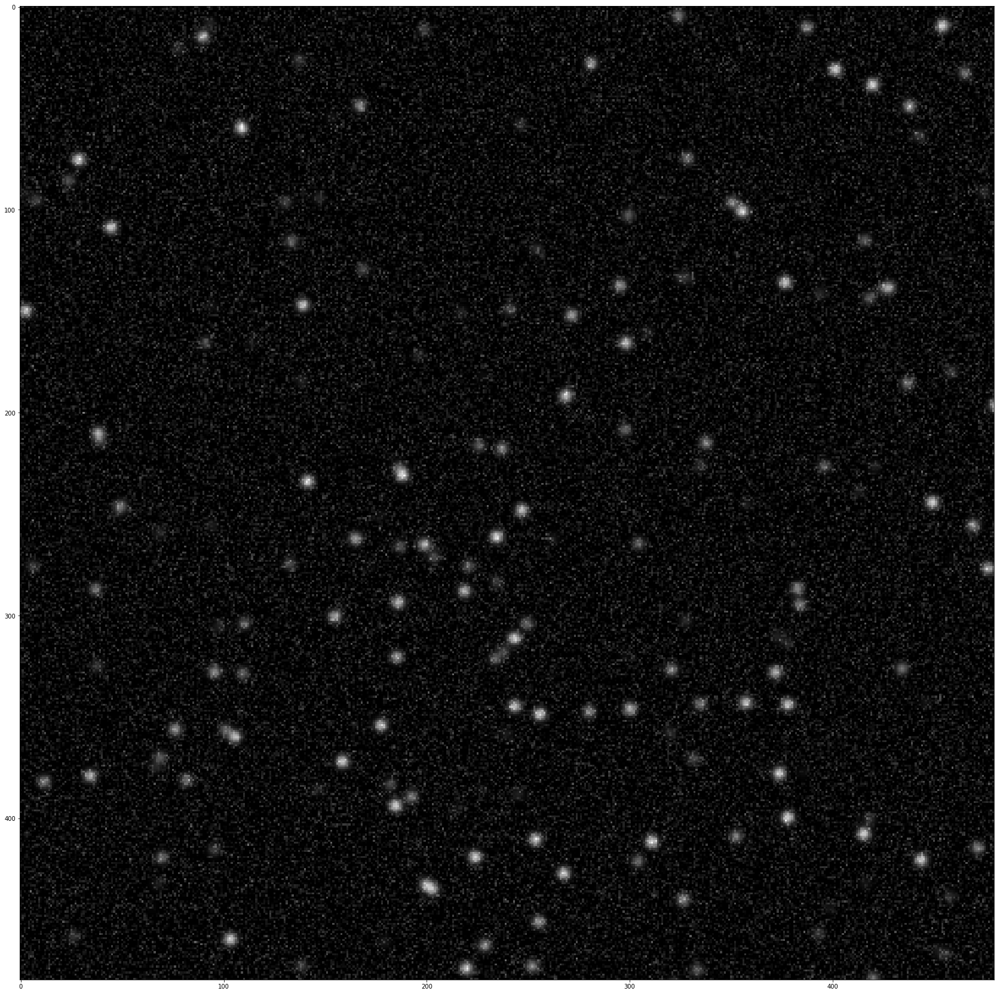

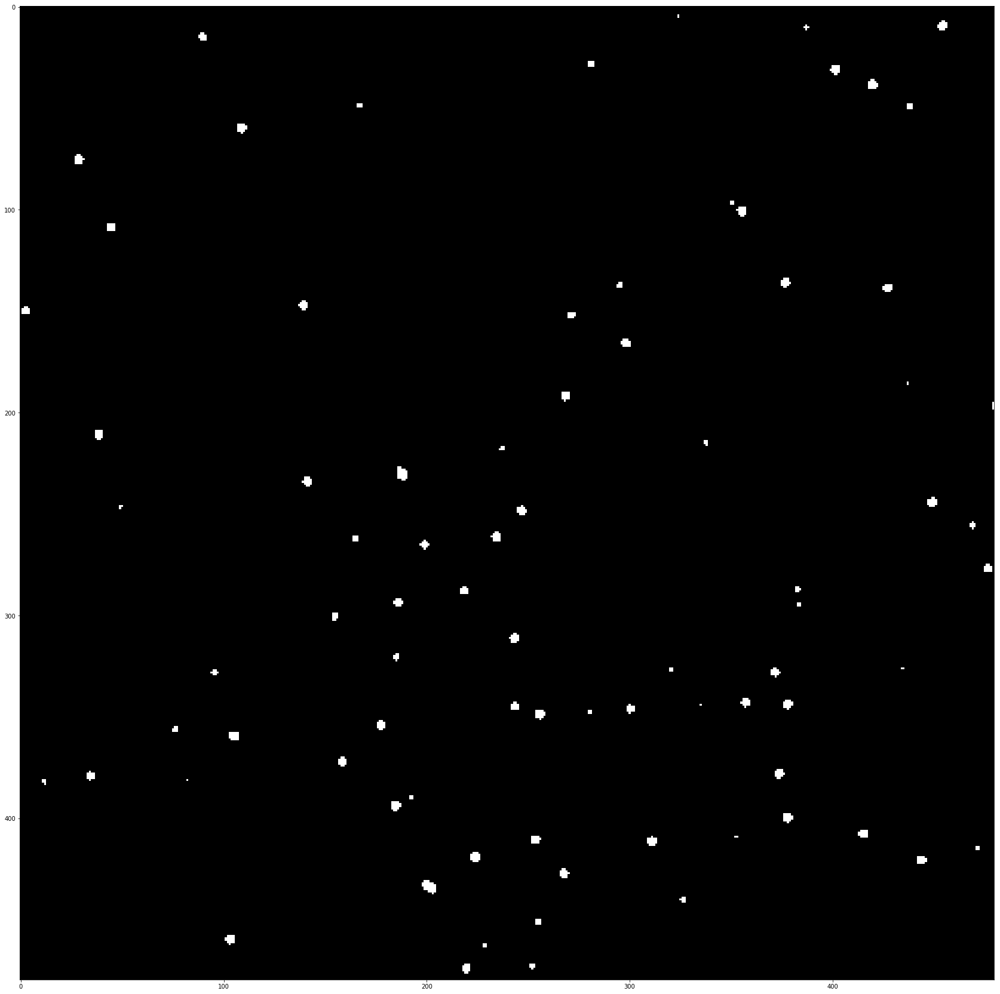

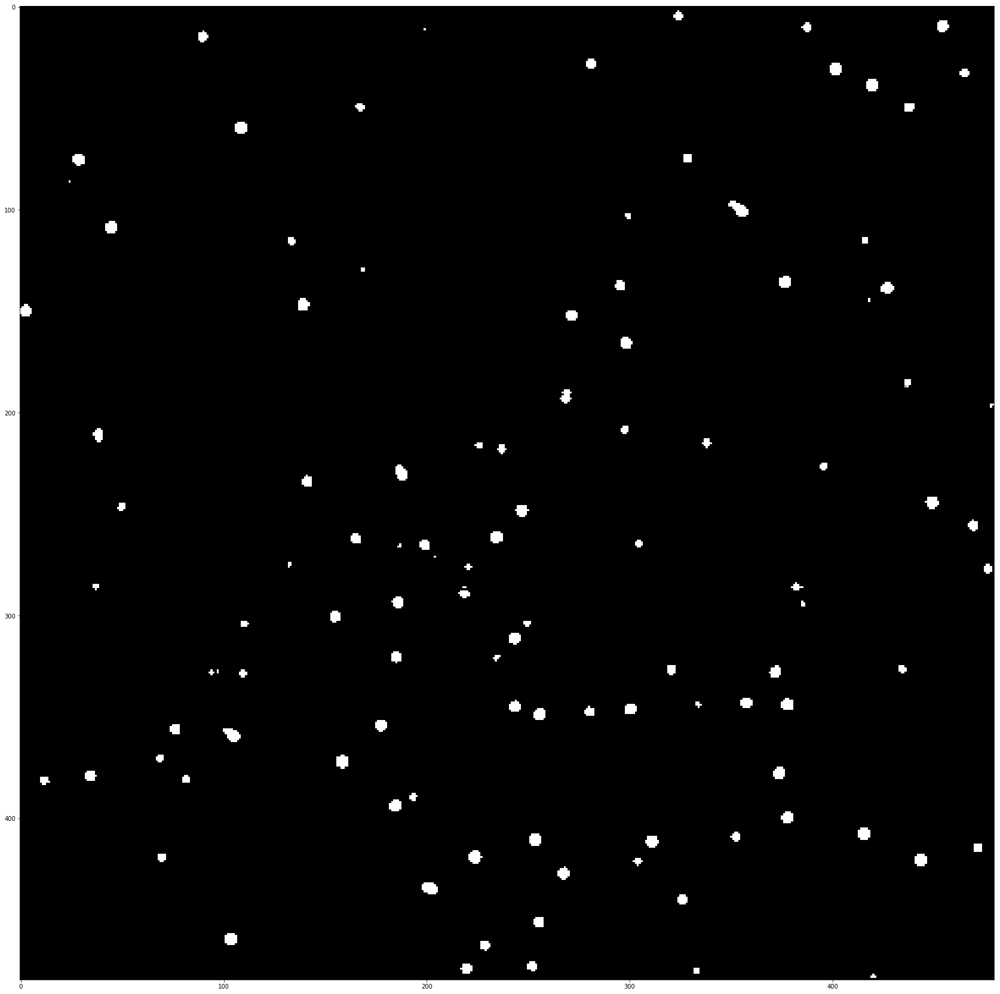

In [23]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]
plt.set_cmap('gray')

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=5)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/psnr5_and_psnr100_5000_particles_setOf3_production/test__X_nonIsotropic_production_5000_2of3_PSNR100_psnr=403.26120309629505_mask_00.tiff")[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=5)
display_slice_from_batch(mask, z=5)
#With oct13_largeframePSNR100_5000_48_nonzero_standardized_local_more-epochs.h5 on larger data size, with no offset
#psnr5

<Figure size 2160x2160 with 0 Axes>

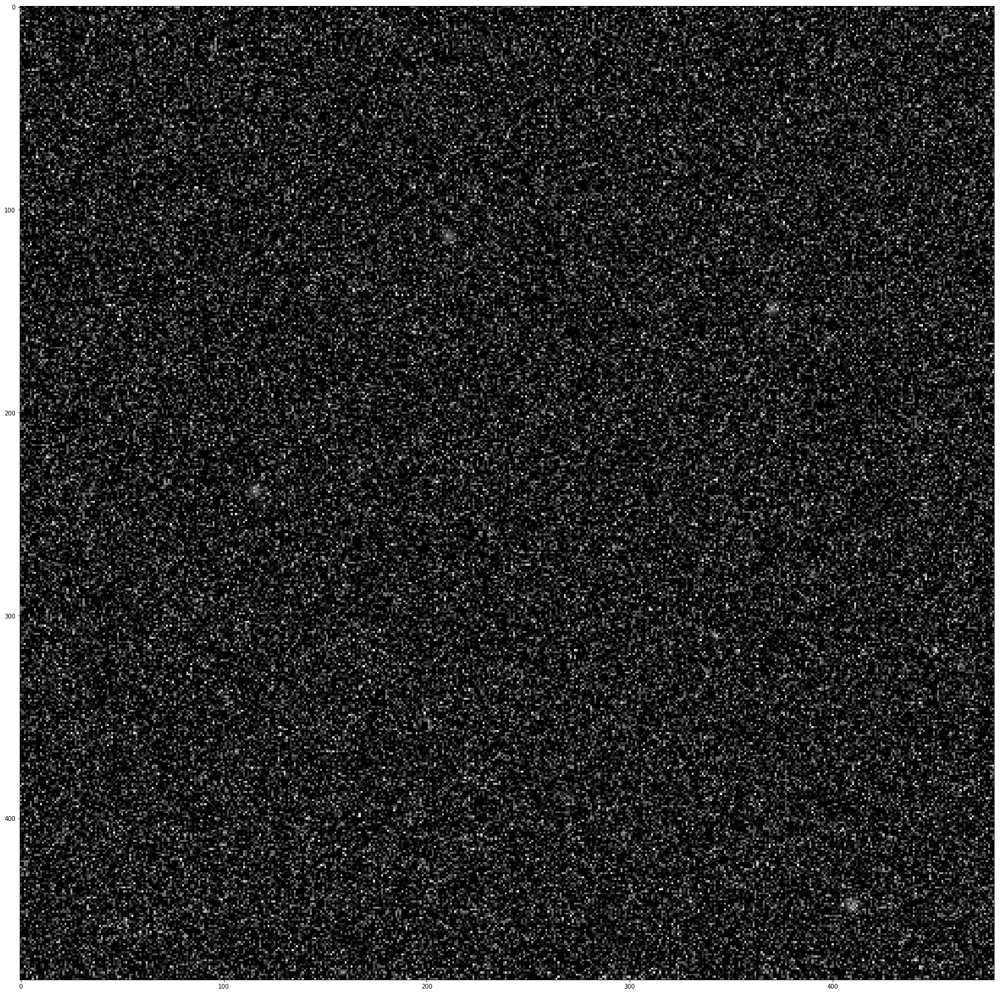

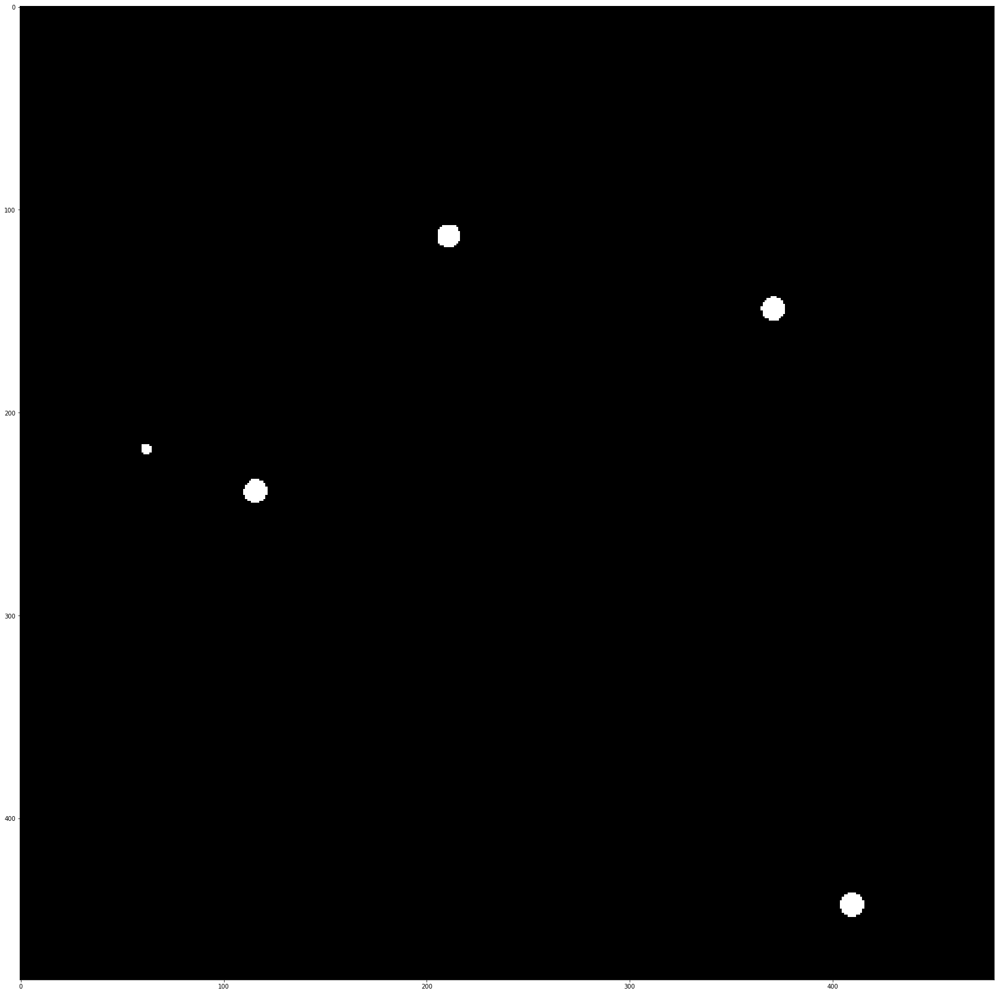

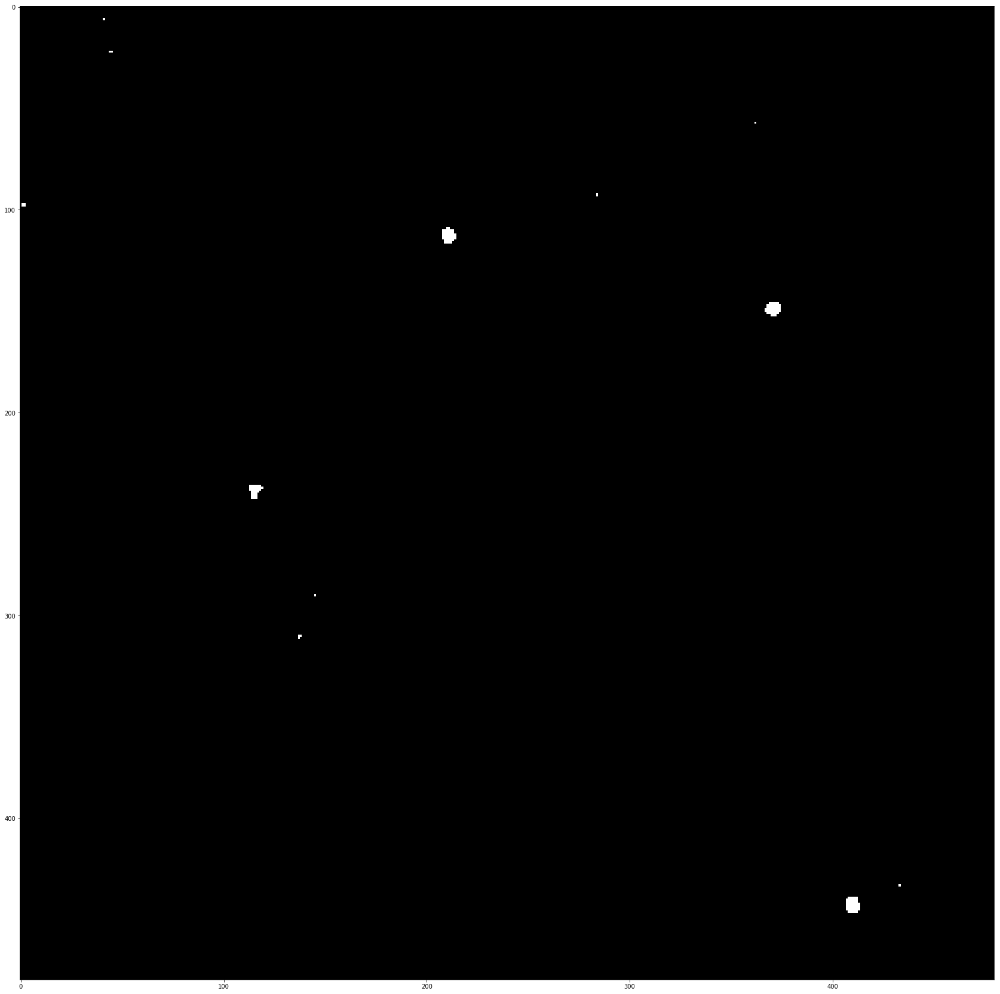

In [8]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]
plt.set_cmap('gray')

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=5)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/psnr5/test__X_nonIsotropic_production_psnr=5.553286238284218_mask_67.tiff")[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=5)
display_slice_from_batch(mask, z=5)
#With oct13_largeframePSNR100_5000_48_nonzero_standardized_local_more-epochs.h5 on larger data size, with no offset
#psnr5 sparse data

<Figure size 2160x2160 with 0 Axes>

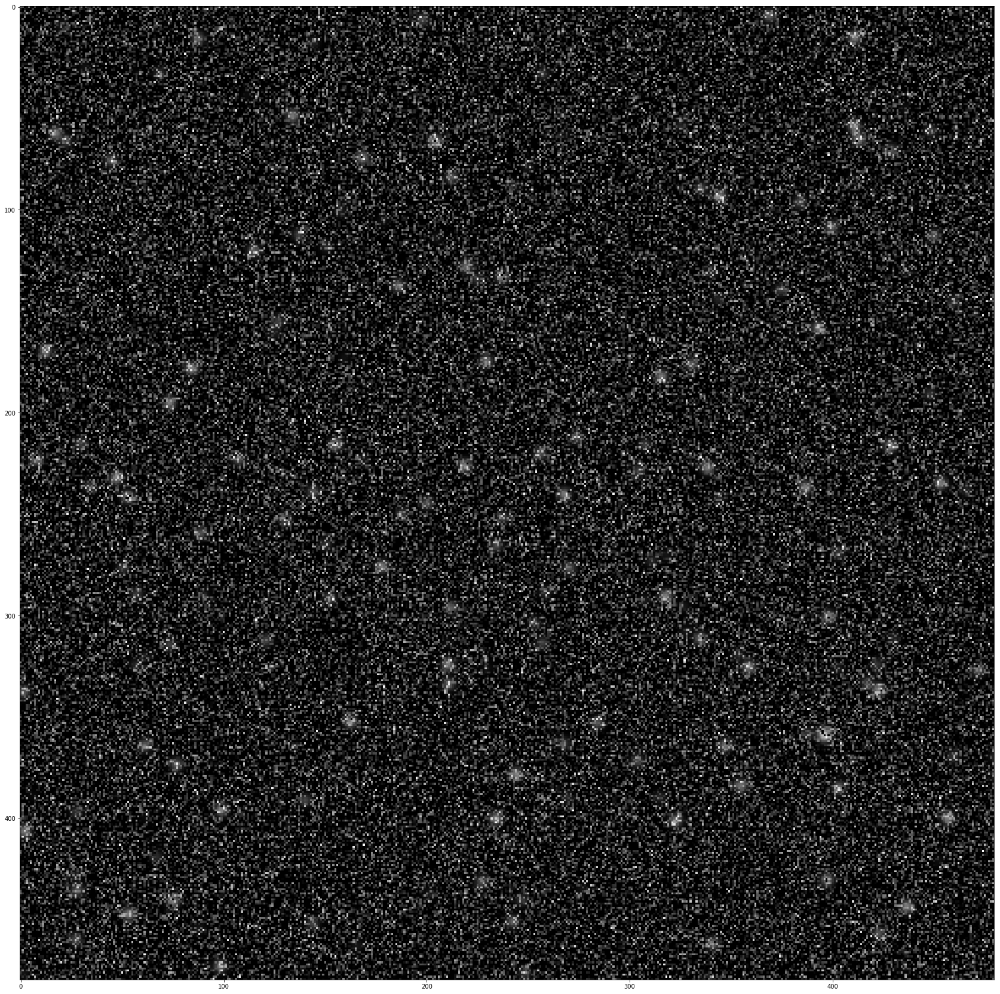

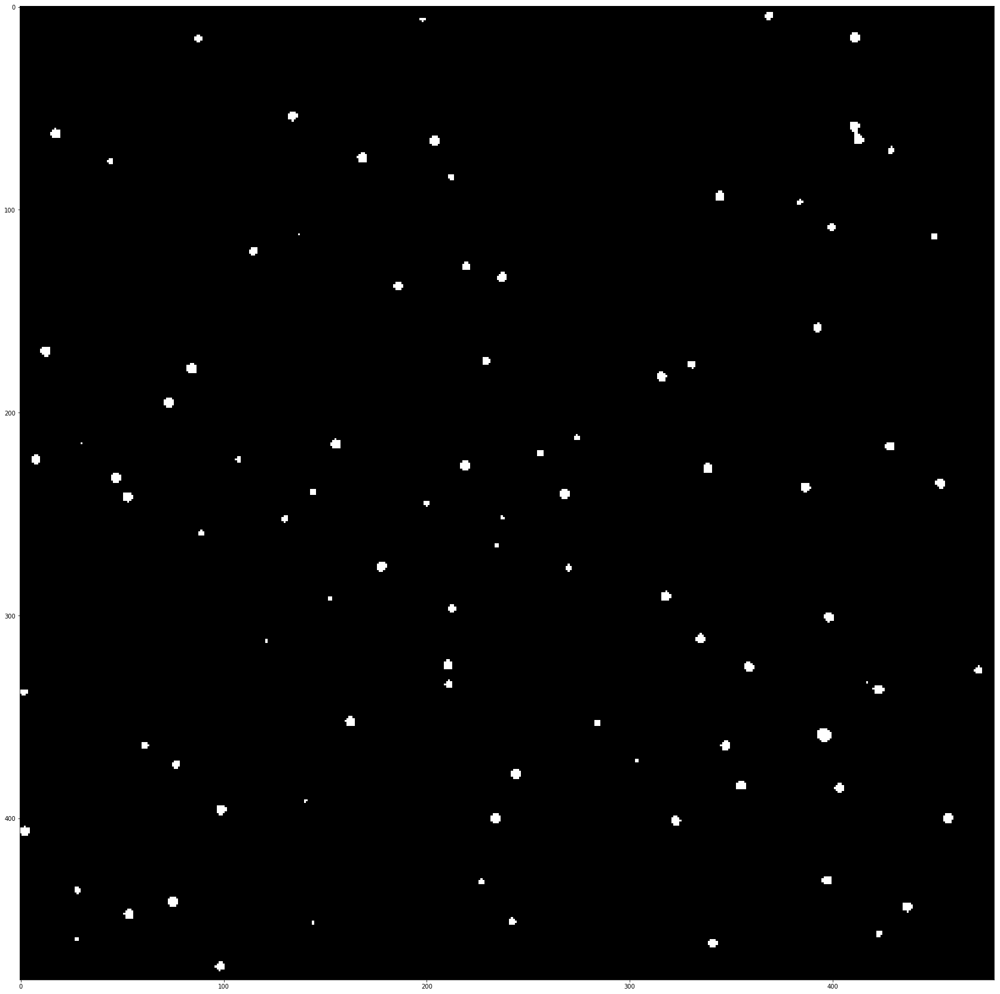

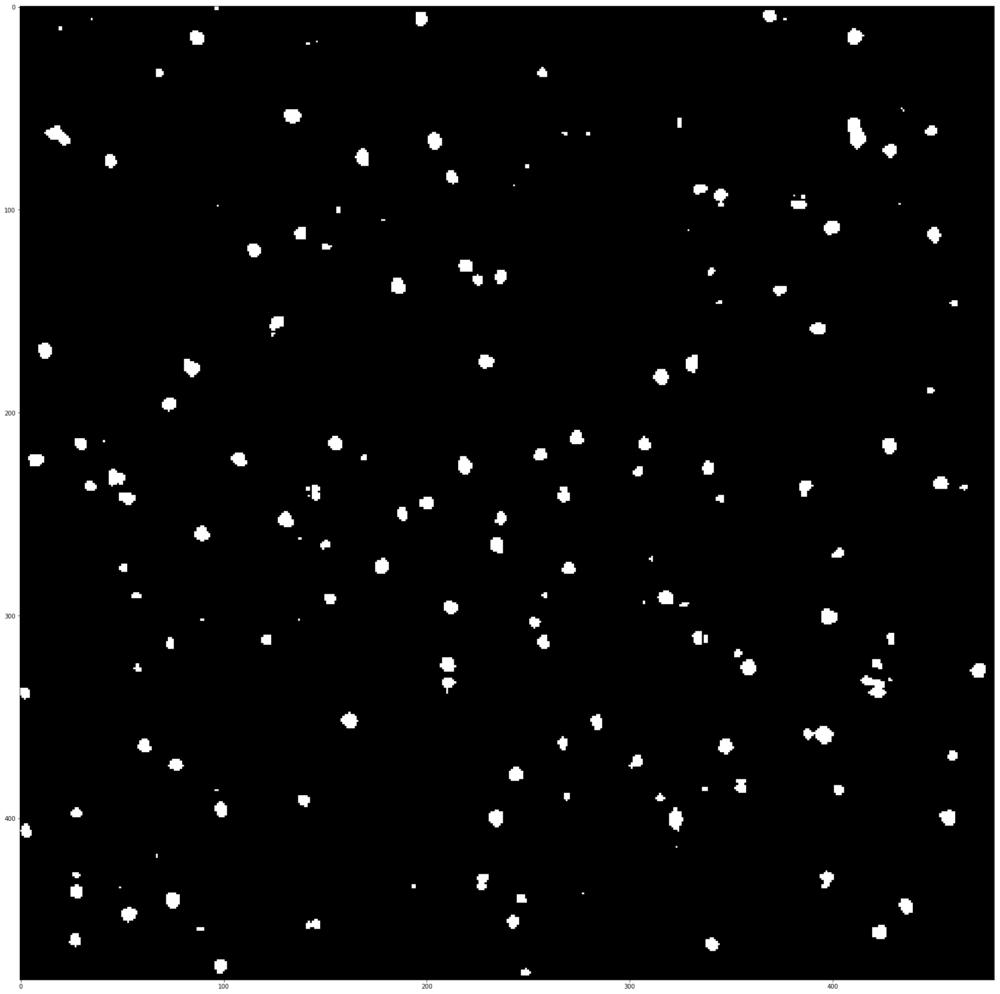

In [13]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]
plt.set_cmap('gray')

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=5)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/psnr5_5000/test__X_nonIsotropic_production_5000_1_PSNR5_psnr=20.06726524985623_mask_00.tiff")[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=5)
display_slice_from_batch(mask, z=5)
#With oct13_largeframePSNR5_5000_48_nonzero_standardized_local_more-epochs.h5 on larger data size, with no offset
#psnr5

<Figure size 2160x2160 with 0 Axes>

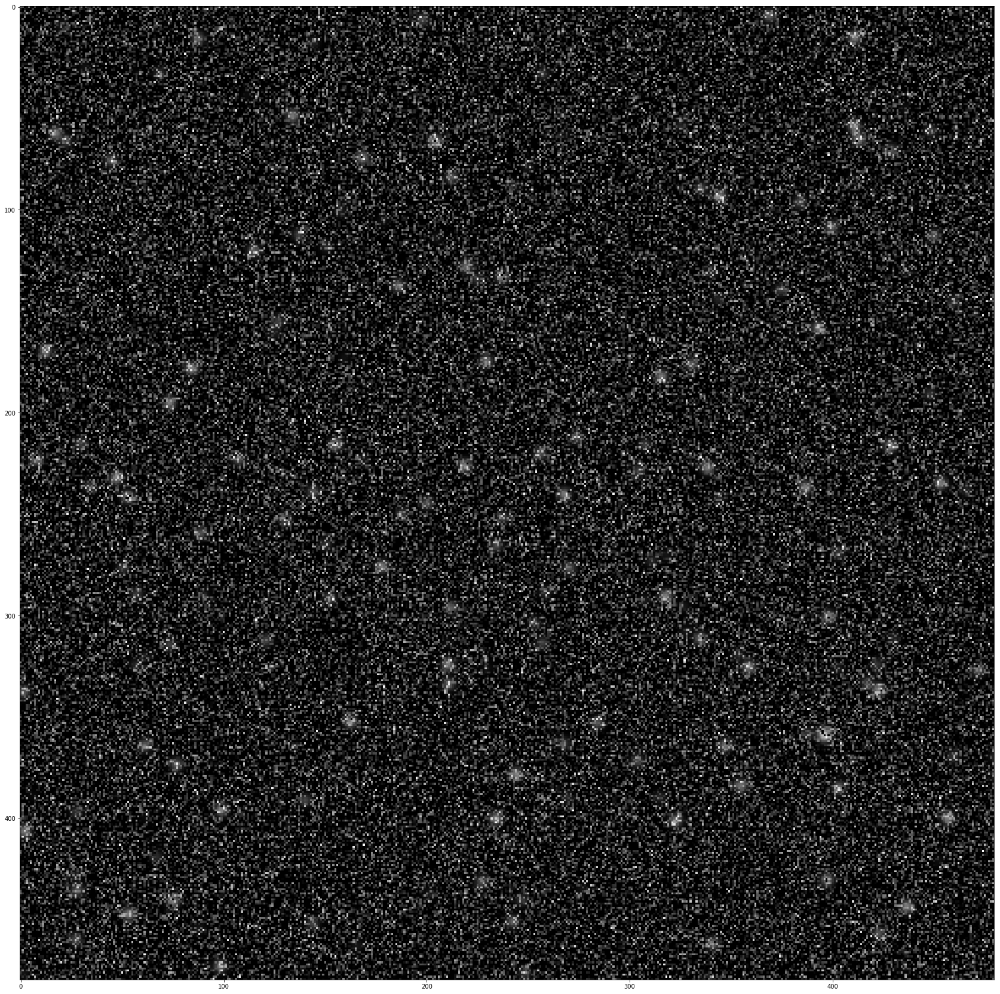

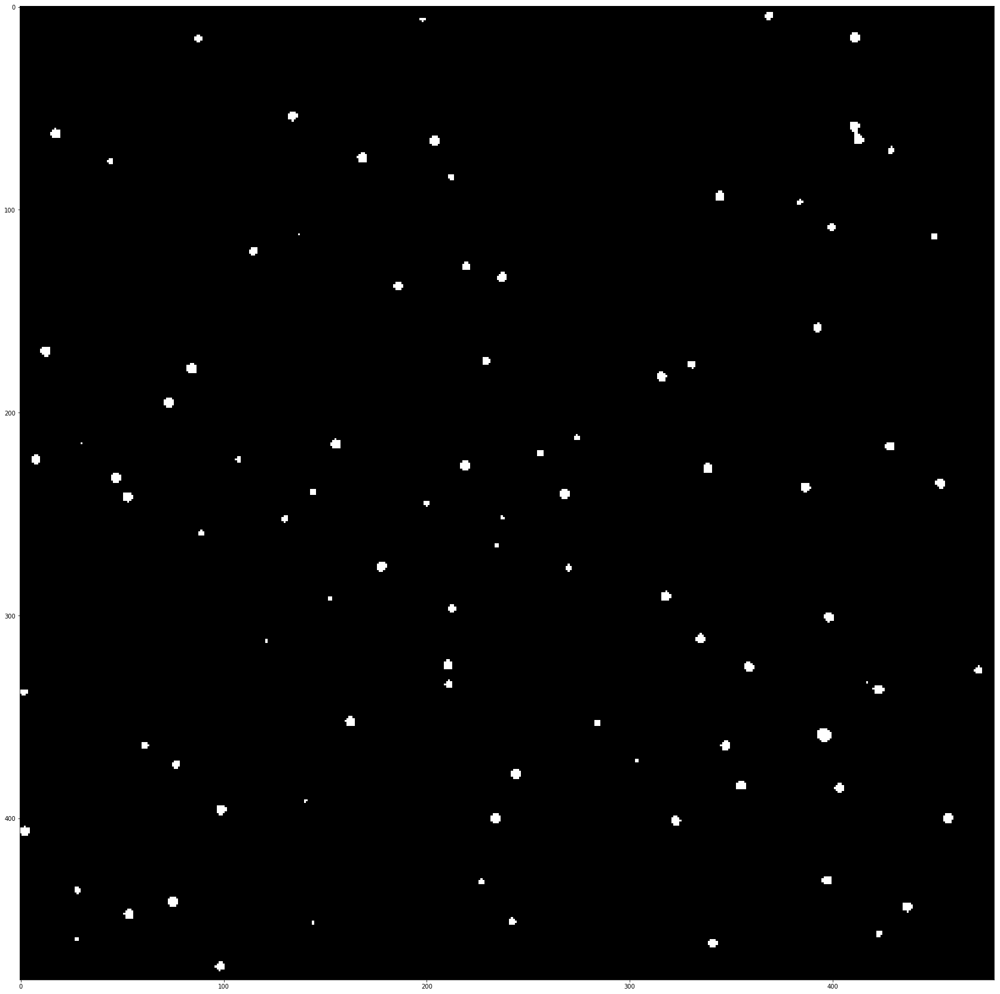

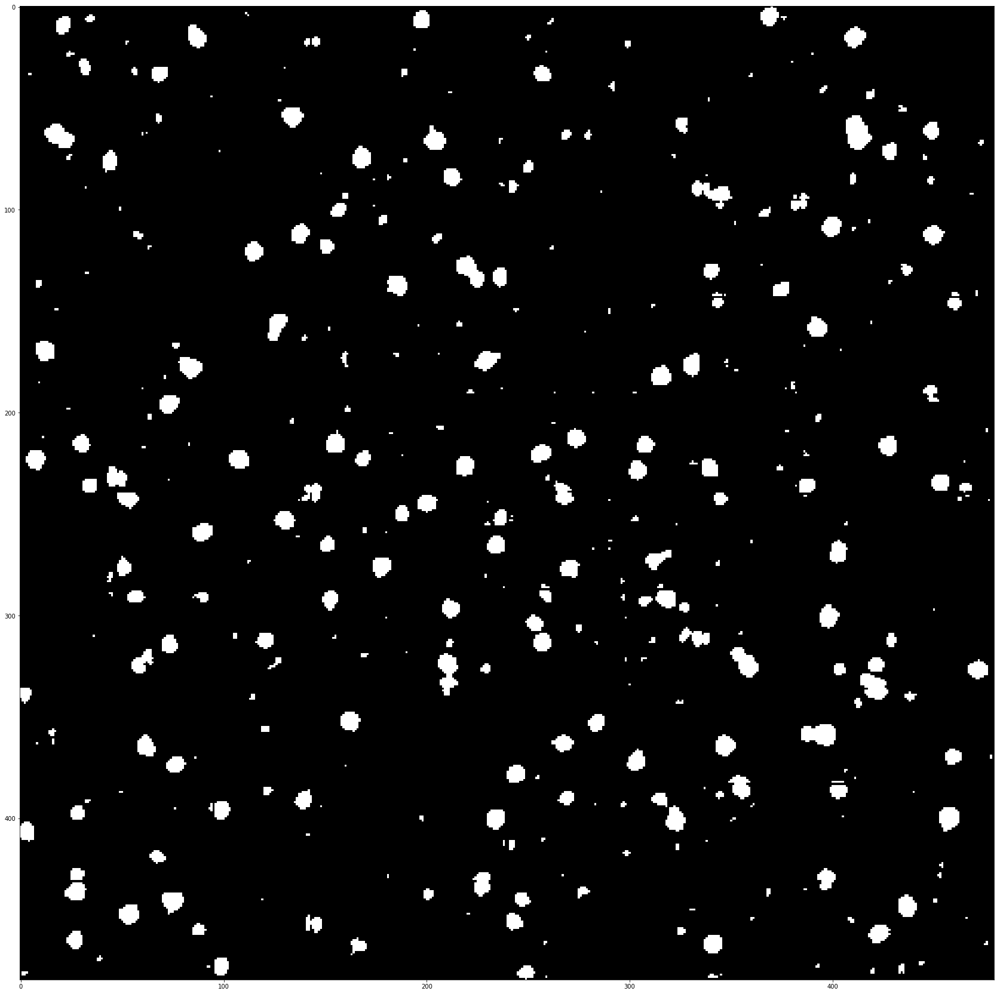

In [9]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]
plt.set_cmap('gray')

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=5)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/psnr5_5000/test__X_nonIsotropic_production_5000_1_PSNR5_psnr=20.06726524985623_mask_00.tiff")[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=5)
display_slice_from_batch(mask, z=5)
#With oct13_largeframePSNR5_5000_48_nonzero_standardized_local.h5 on larger data size, with no offset
#psnr5

<Figure size 2160x2160 with 0 Axes>

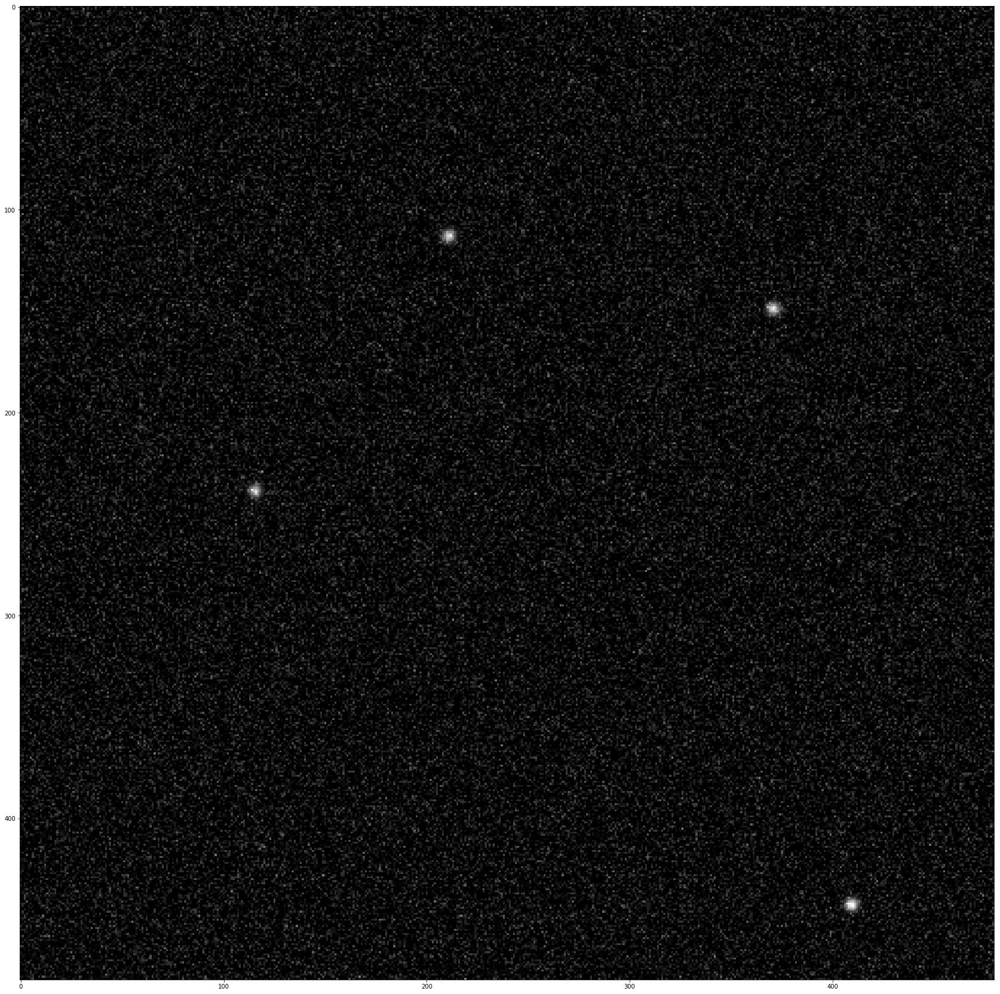

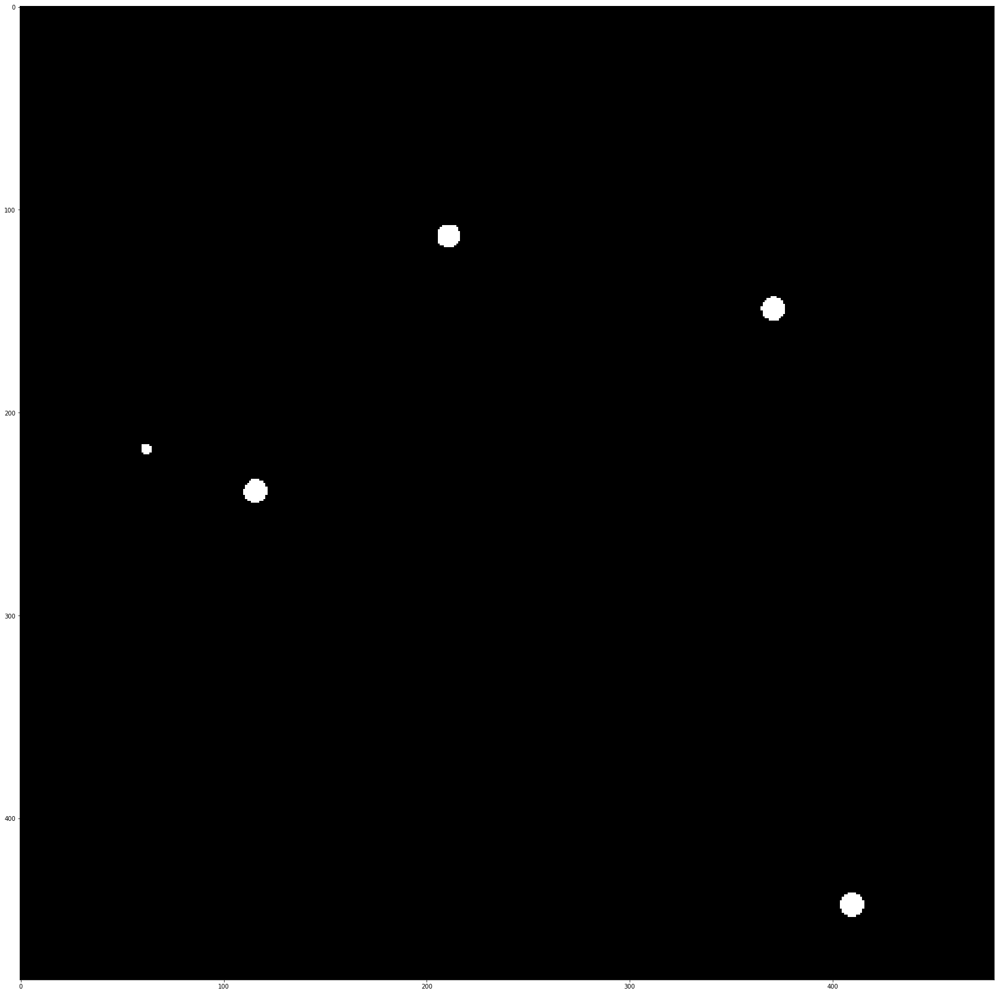

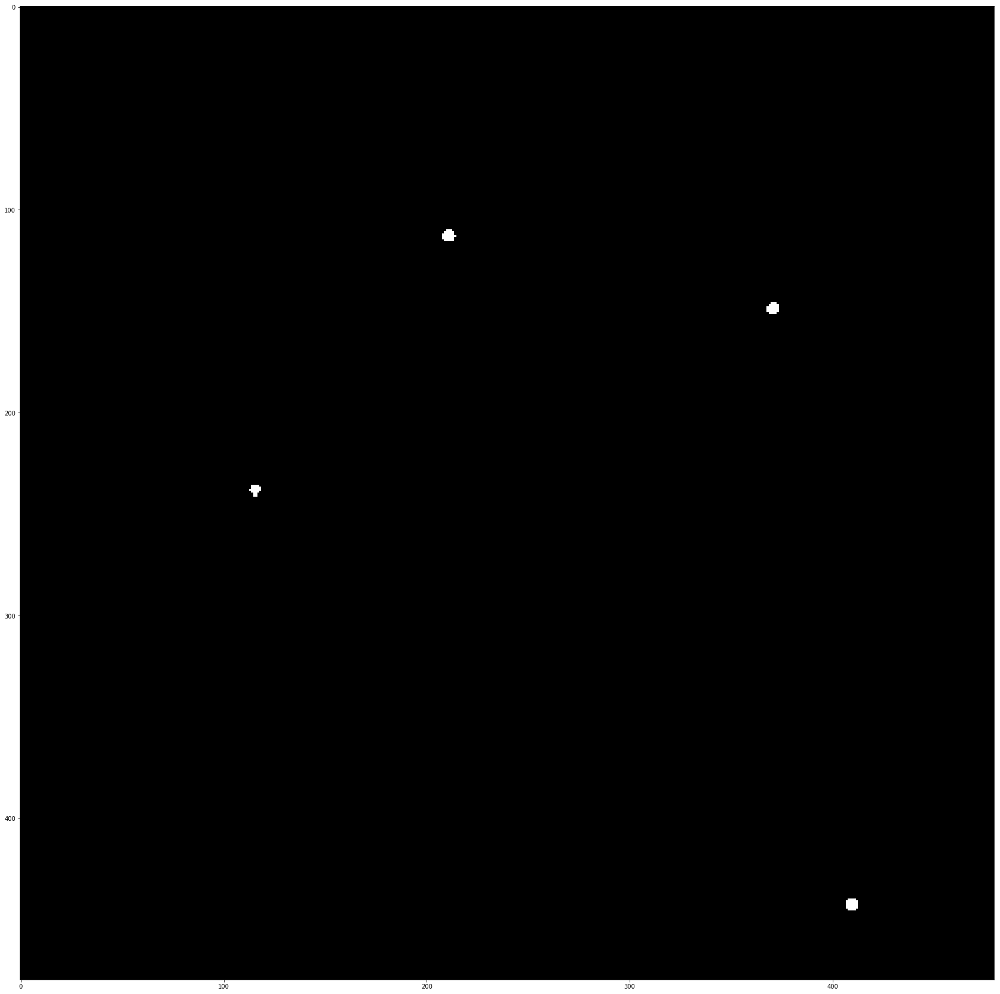

In [18]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]
plt.set_cmap('gray')

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=5)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/psnr100/test__X_nonIsotropic_production_psnr=118.12551042793959_mask_67.tiff")[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=5)
display_slice_from_batch(mask, z=5)
#With oct13_largeframePSNR100_5000_48_nonzero_standardized_local.h5 on larger data size, with no offset
#psnr100

<Figure size 2160x2160 with 0 Axes>

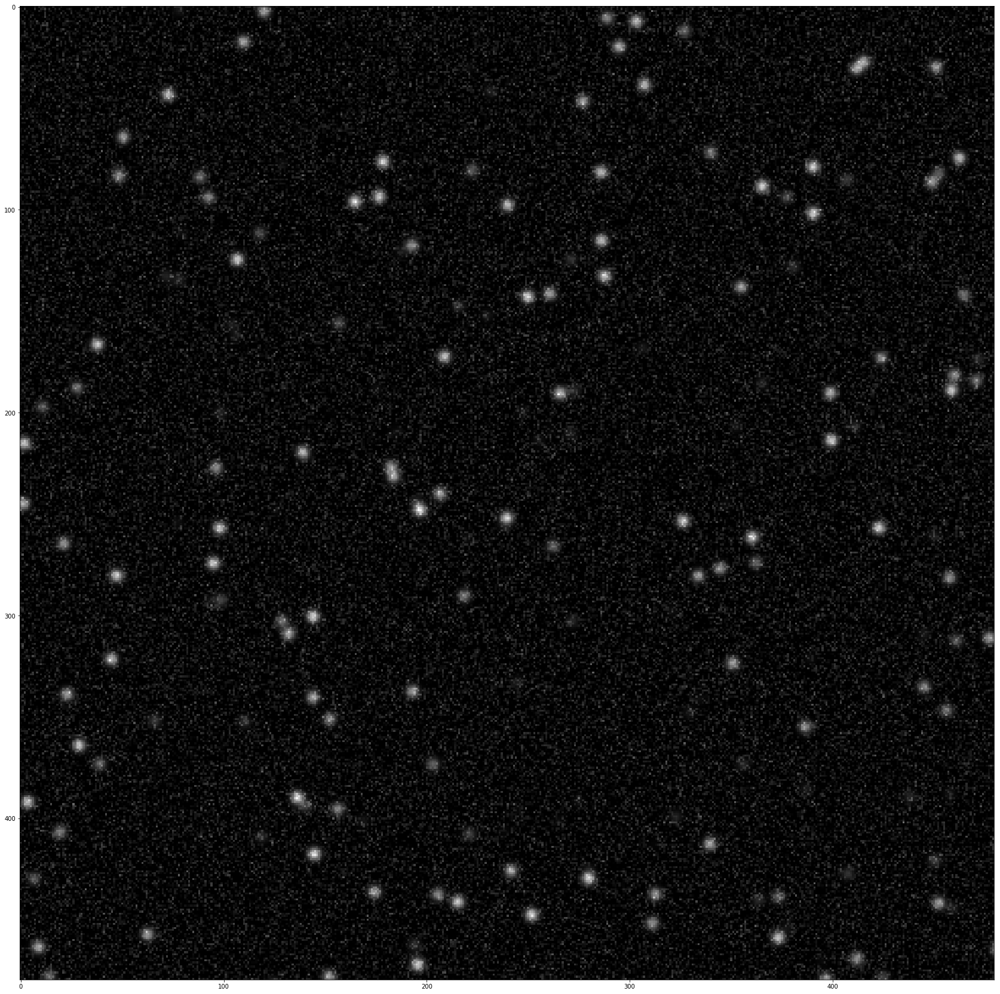

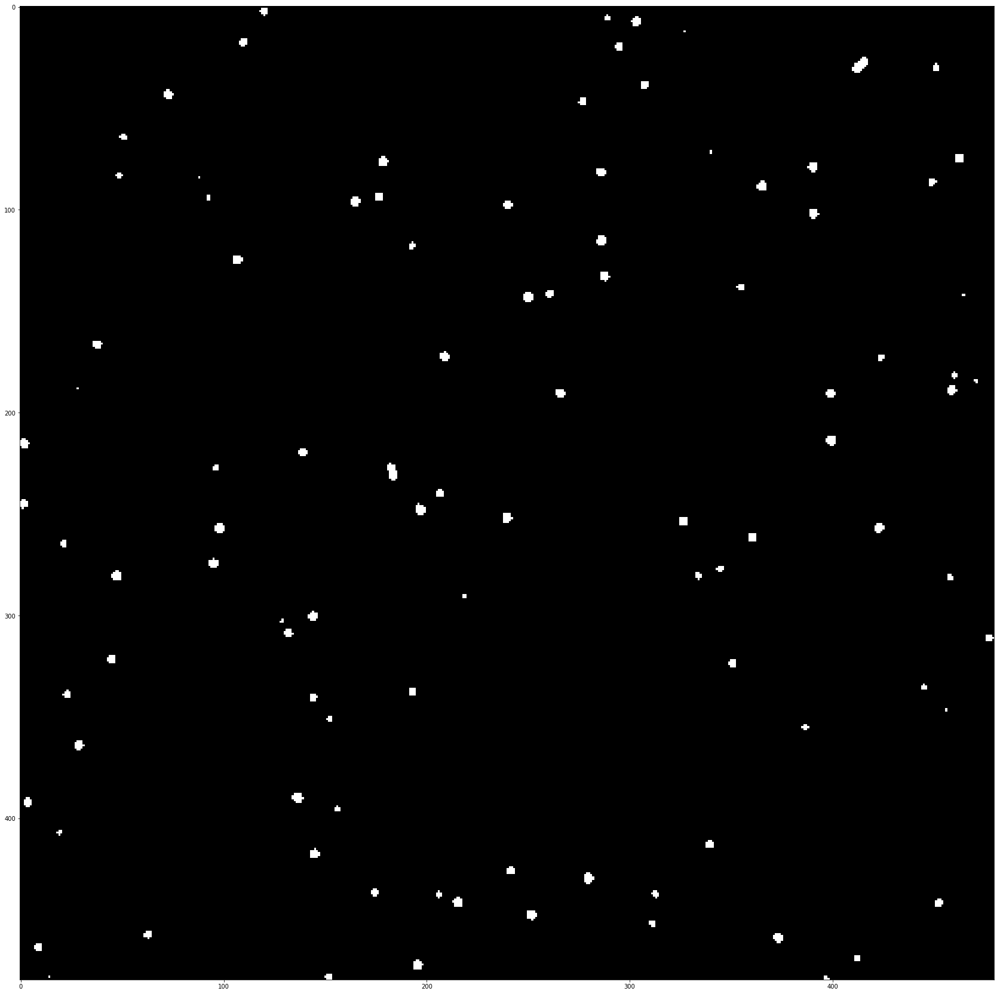

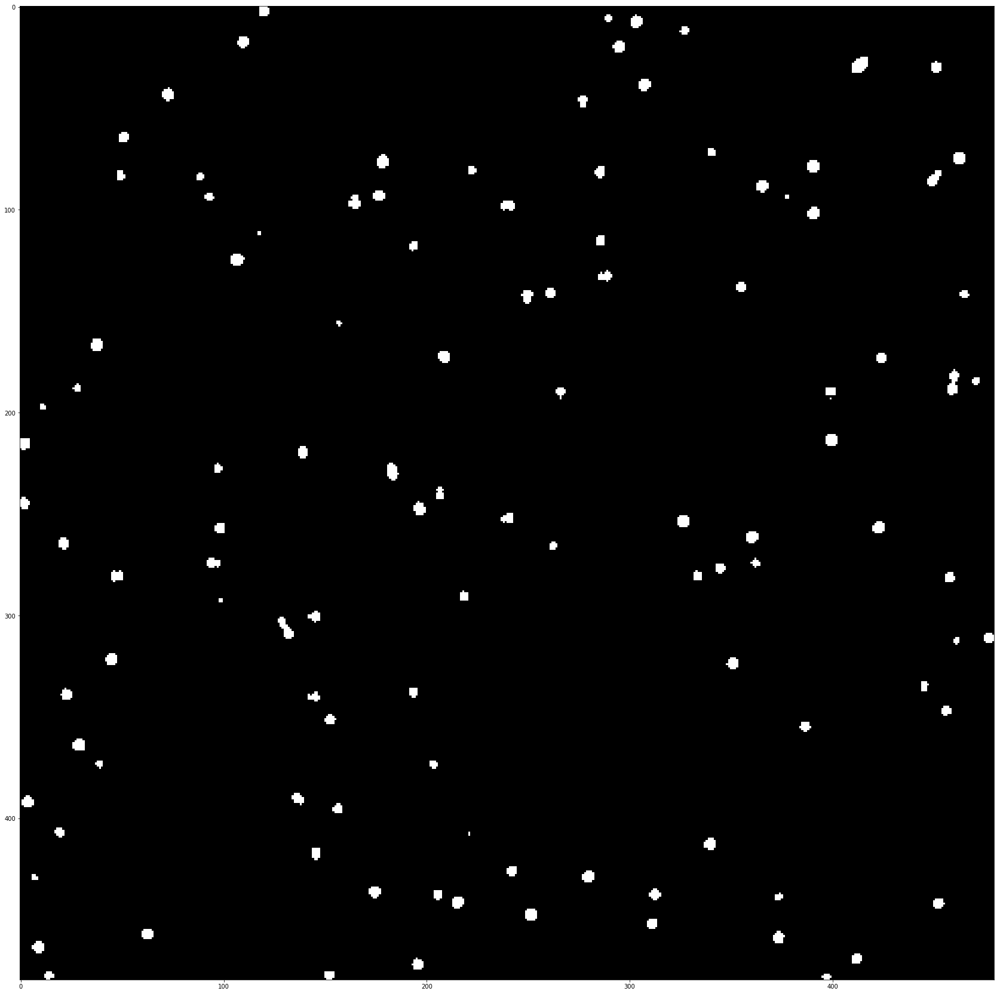

In [14]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]
plt.set_cmap('gray')

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=5)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/psnr100_5000/test__X_nonIsotropic_production_5000_1_psnr=730.959357415139_mask_00.tiff")[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=5)
display_slice_from_batch(mask, z=5)
#With oct13_largeframePSNR100_5000_48_nonzero_standardized_local.h5 on larger data size, with no offset
#psnr100

<Figure size 2160x2160 with 0 Axes>

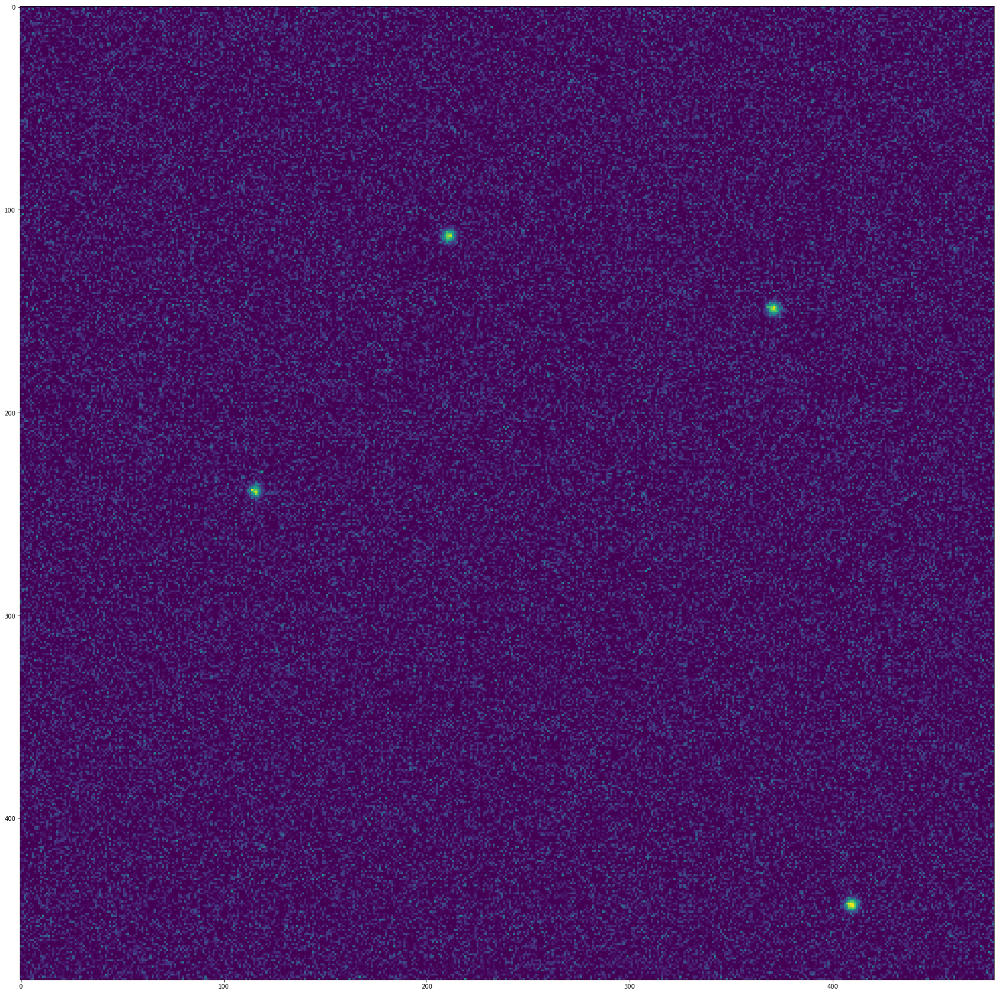

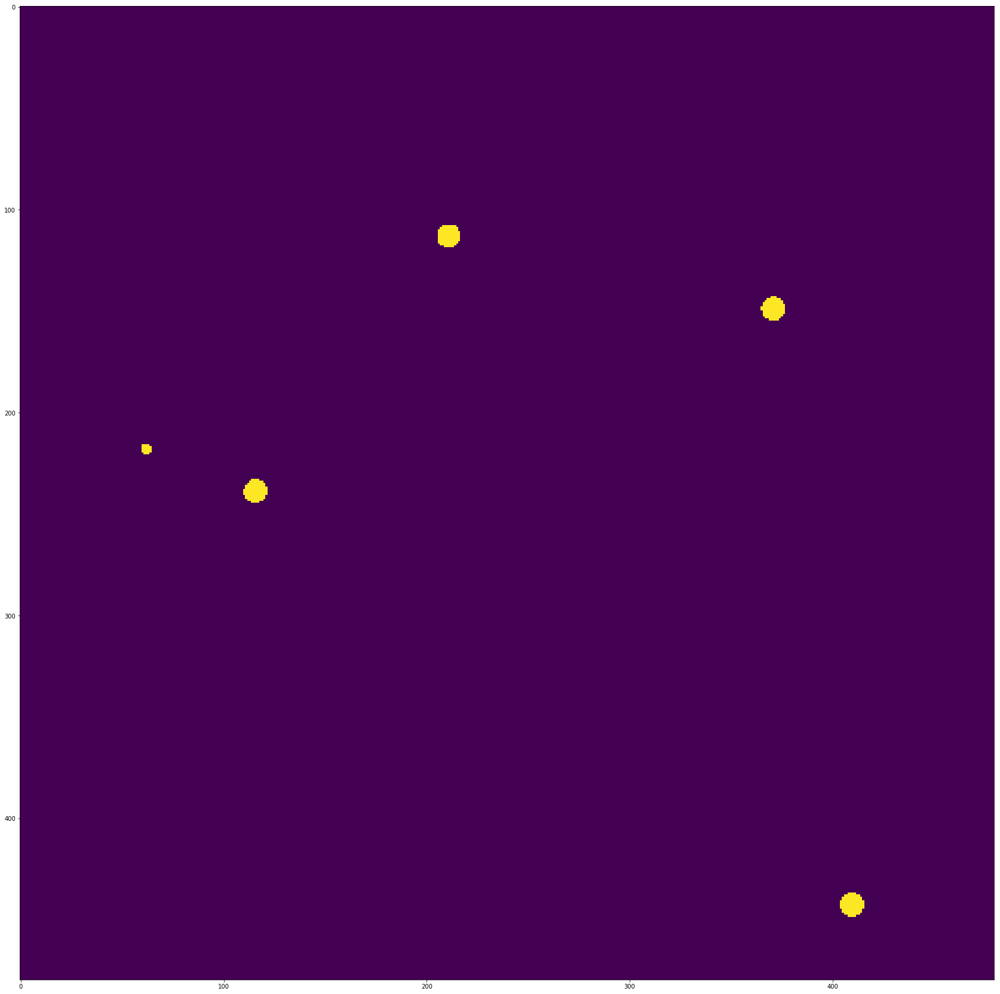

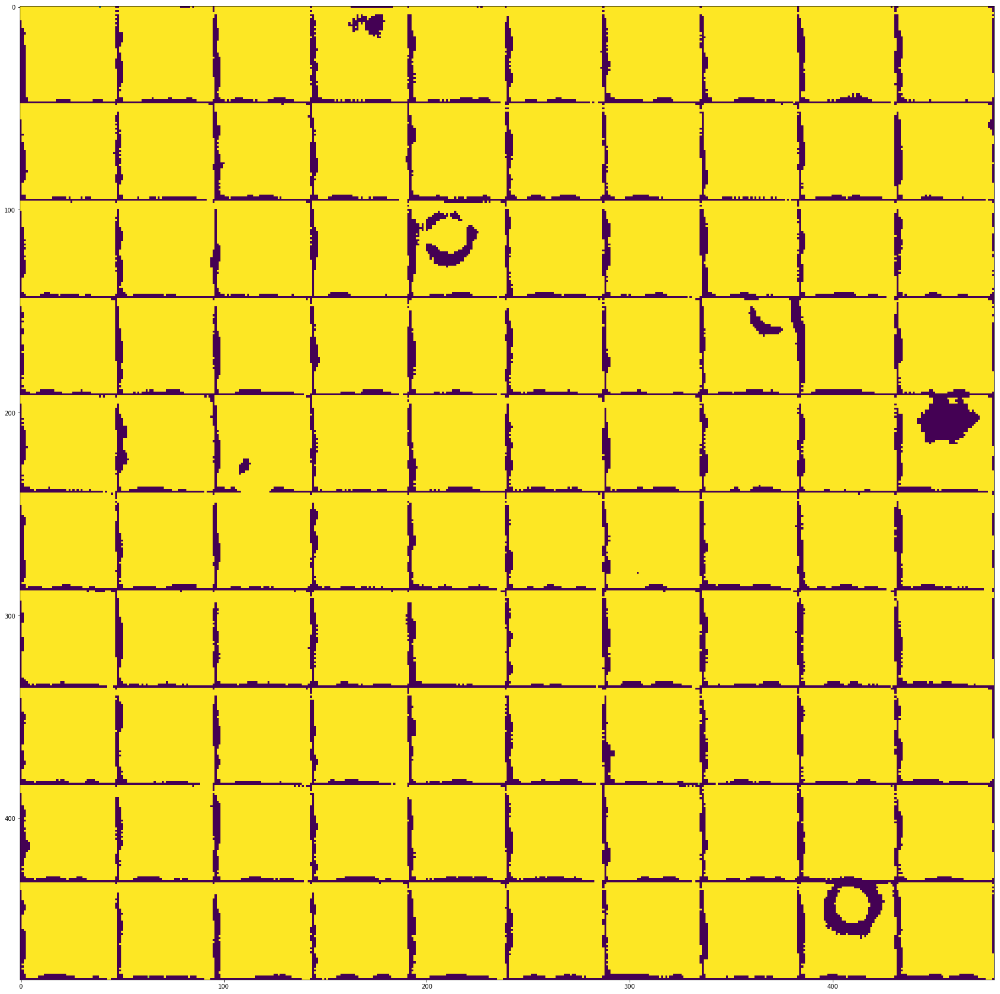

In [6]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]
plt.set_cmap('viridis')

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=5)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/psnr100/test__X_nonIsotropic_production_psnr=118.12551042793959_mask_67.tiff")[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=5)
display_slice_from_batch(mask, z=5)
#With oct13_largeframePSNR100_48_all_standardized_local.h5 on larger data size, with no offset
#psnr100

<Figure size 2160x2160 with 0 Axes>

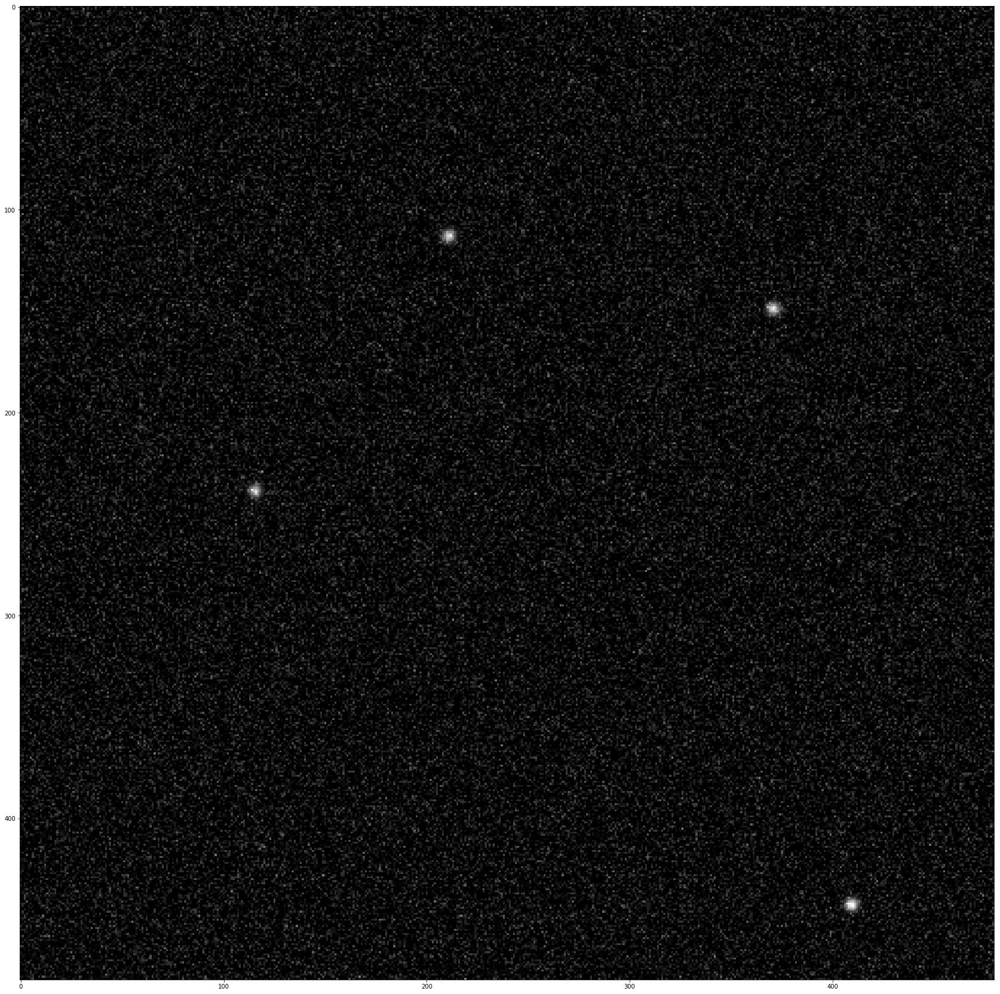

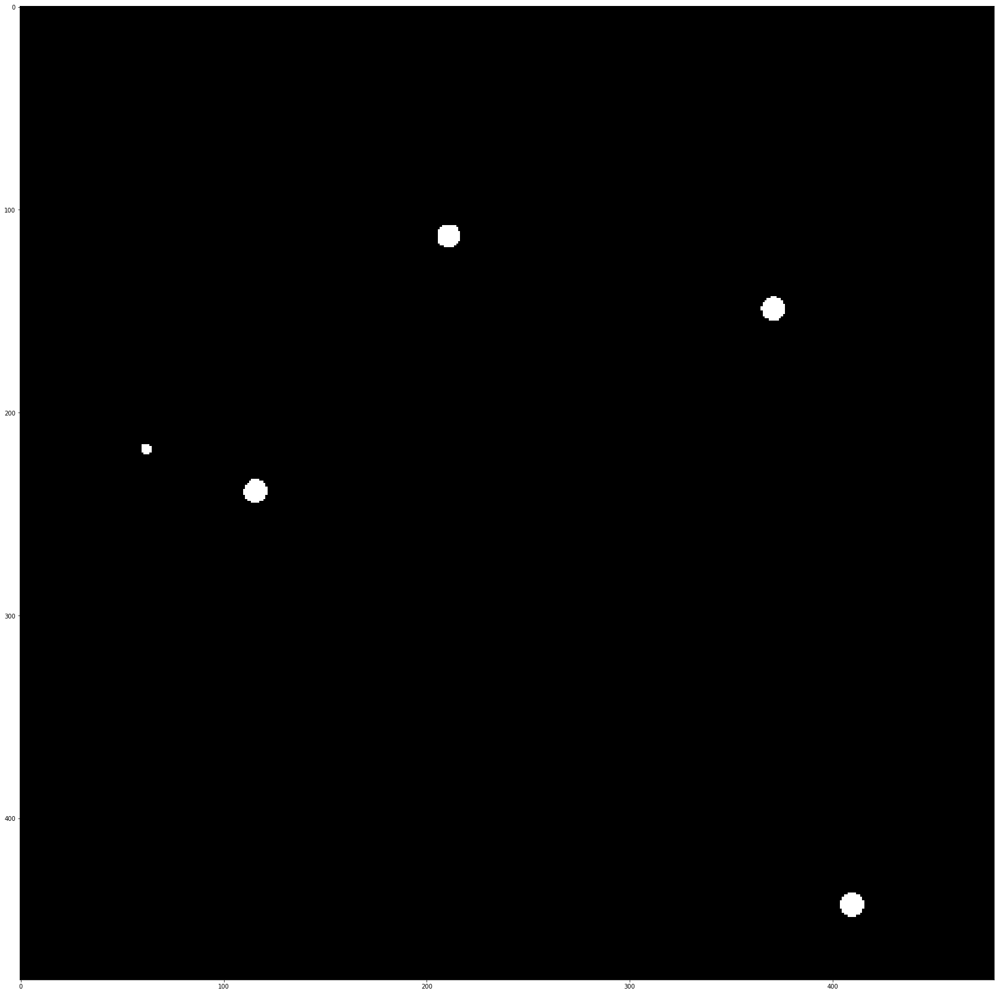

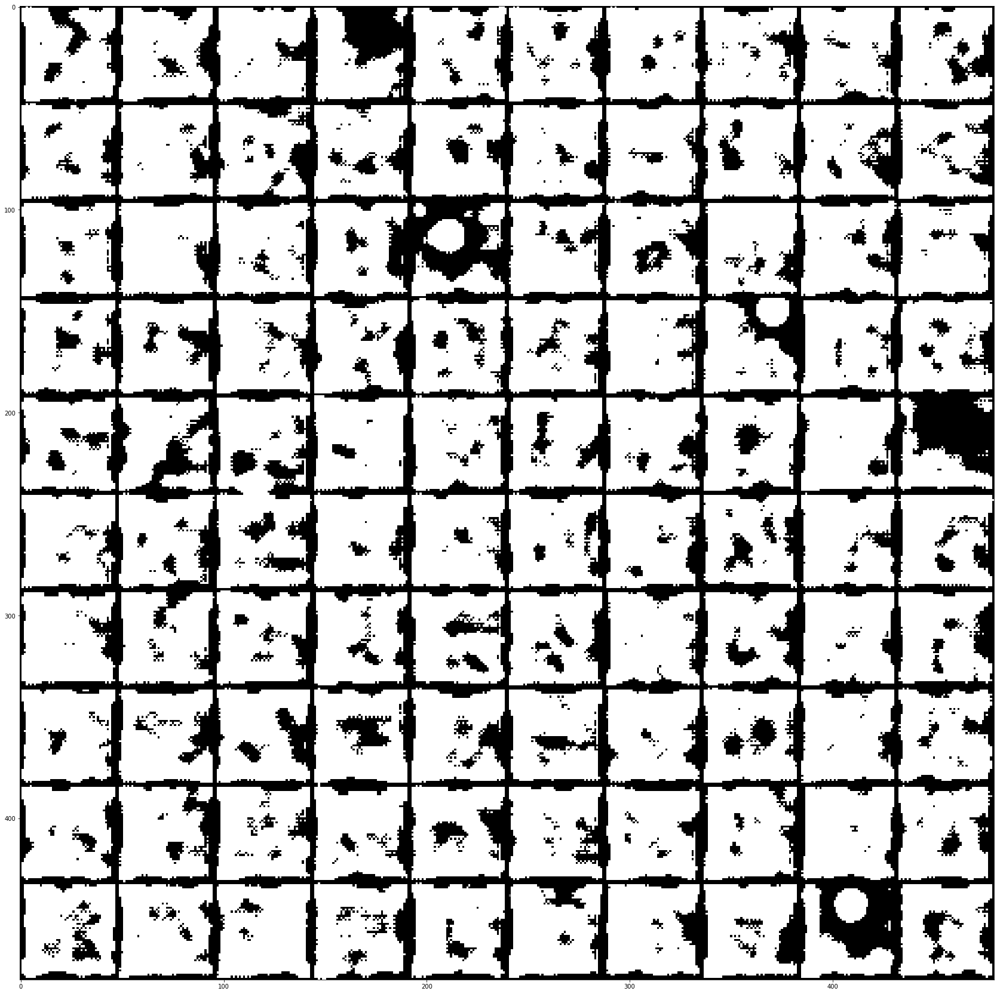

In [5]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]
plt.set_cmap('gray')

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=5)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/psnr100/test__X_nonIsotropic_production_psnr=118.12551042793959_mask_67.tiff")[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=5)
display_slice_from_batch(mask, z=5)
#With oct13_largeframePSNR100_48_nonzero_standardized_local.h5 on larger data size, with no offset
#psnr100

<Figure size 2160x2160 with 0 Axes>

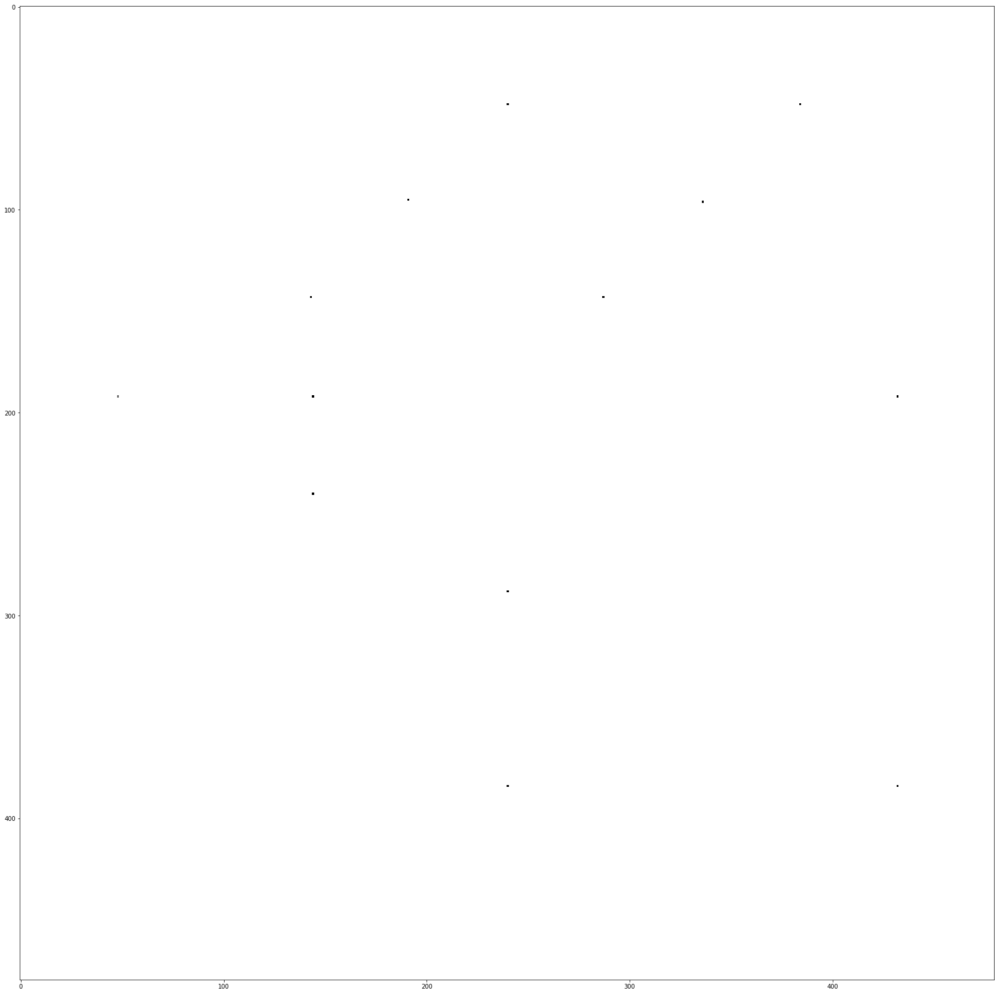

In [20]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]
plt.set_cmap('gray')

#display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=0)
#display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/psnr5/test__X_nonIsotropic_production_psnr=5.553286238284218_mask_67.tiff")[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=0)
display_slice_from_batch(mask, z=239)
#With oct13_5largeframePSNR5_48_all_standardized_local.h5 on larger data size, with no offset
#psnr5

<Figure size 2160x2160 with 0 Axes>

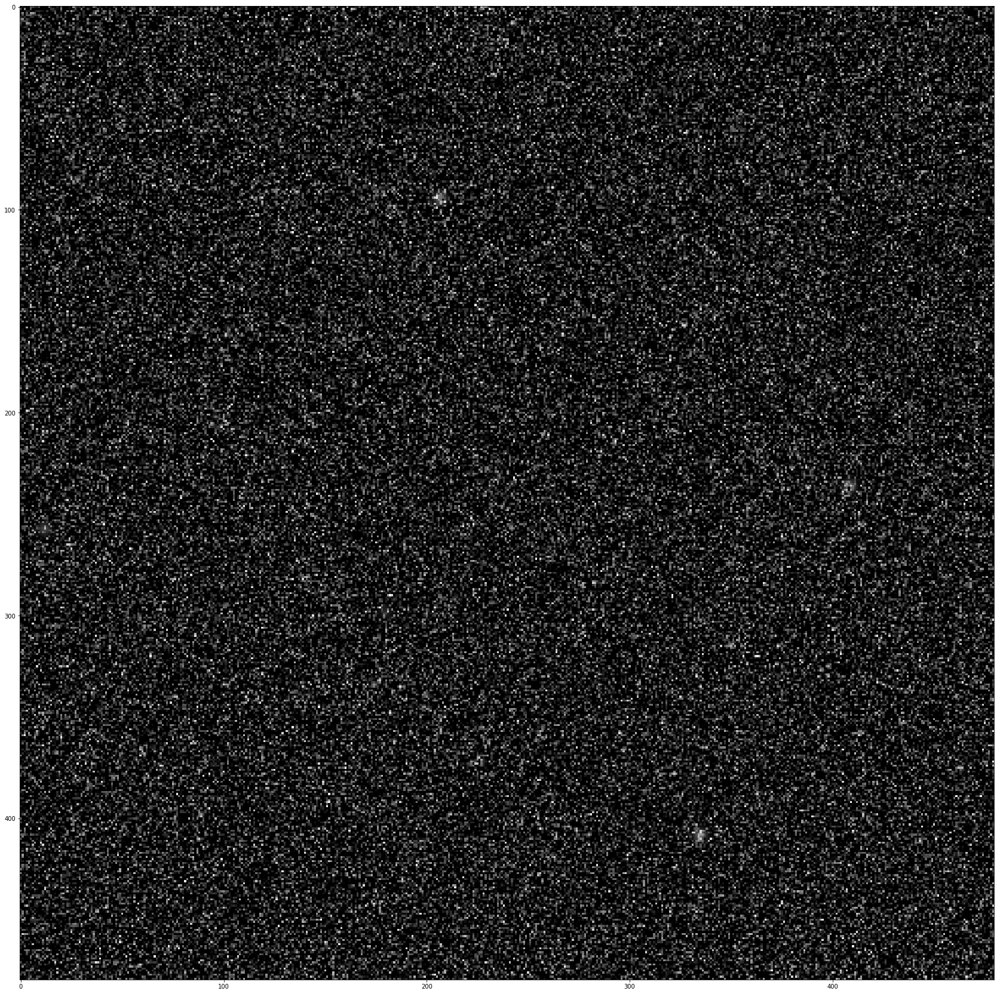

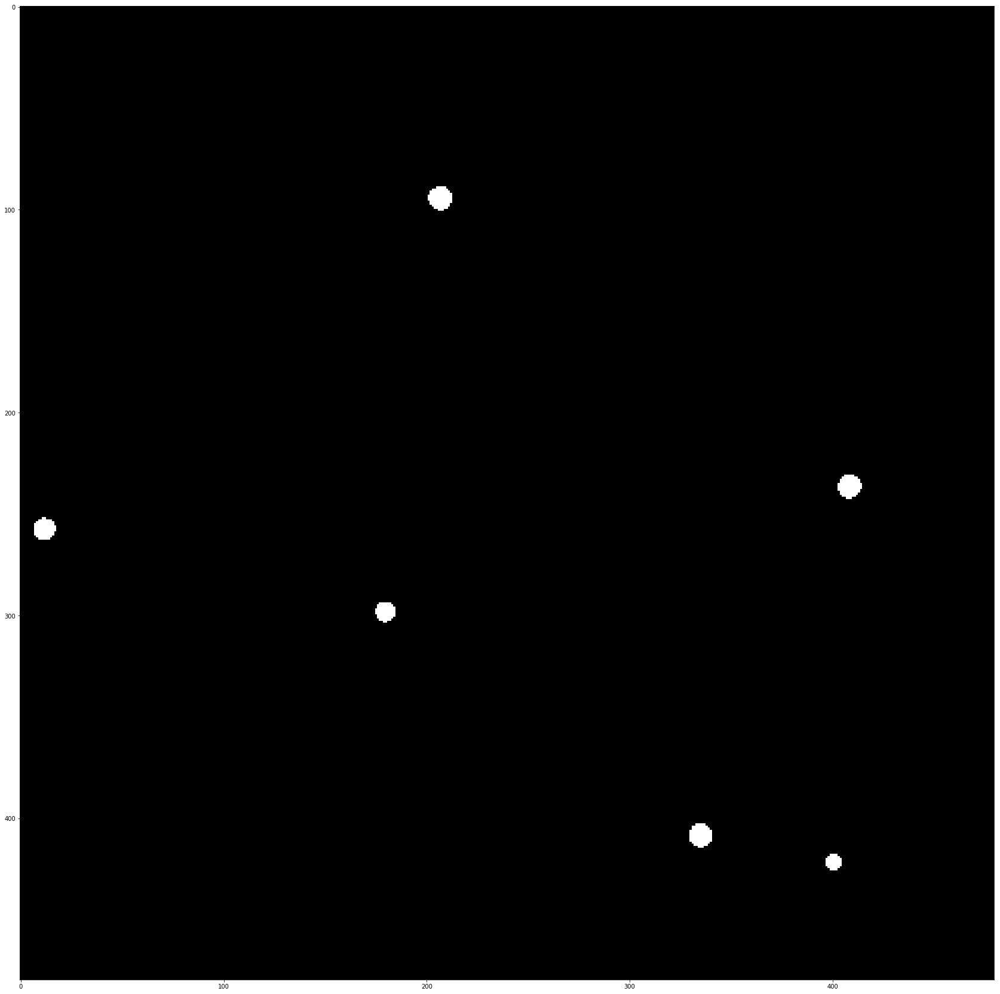

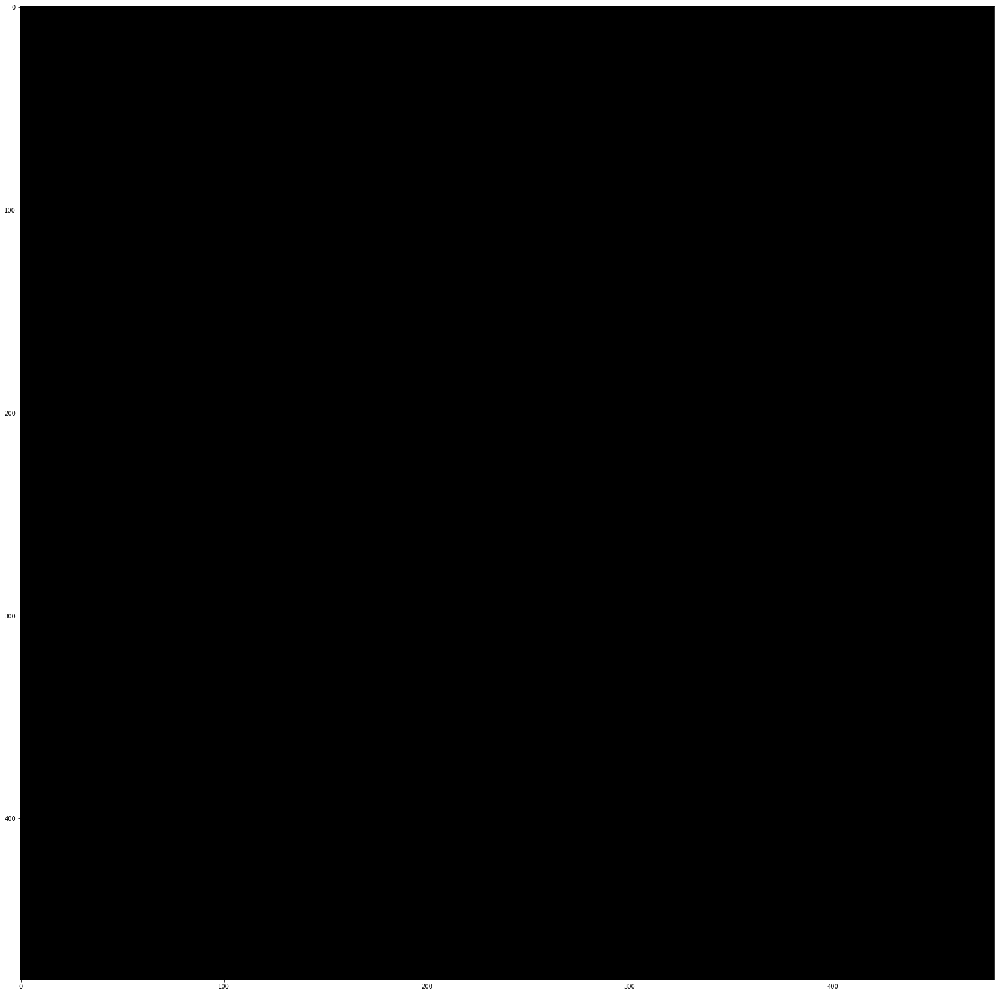

In [25]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]
plt.set_cmap('gray')

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=48)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/psnr5/test__X_nonIsotropic_production_psnr=5.553286238284218_mask_67.tiff")[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=48)
display_slice_from_batch(mask, z=48)
#With oct13_5largeframePSNR5_48_nonzero_standardized_local.h5 on larger data size, with no offset
#psnr5

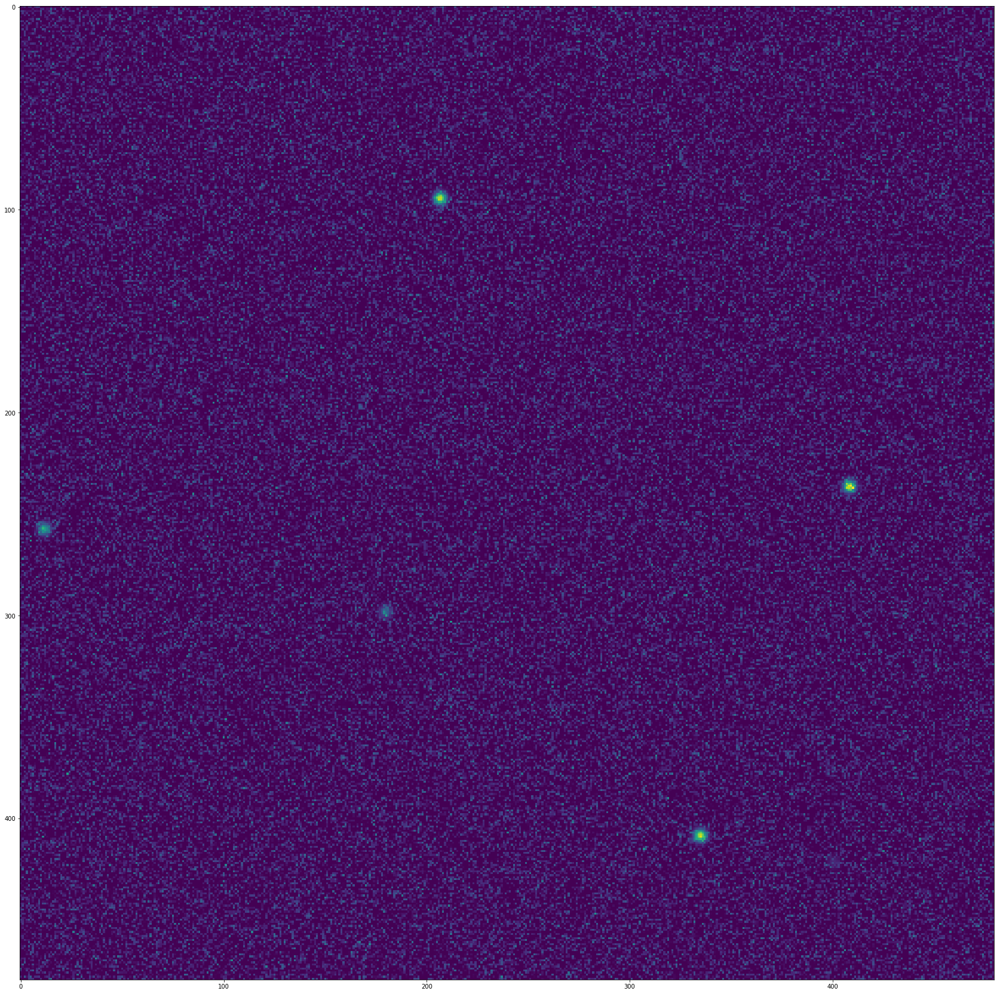

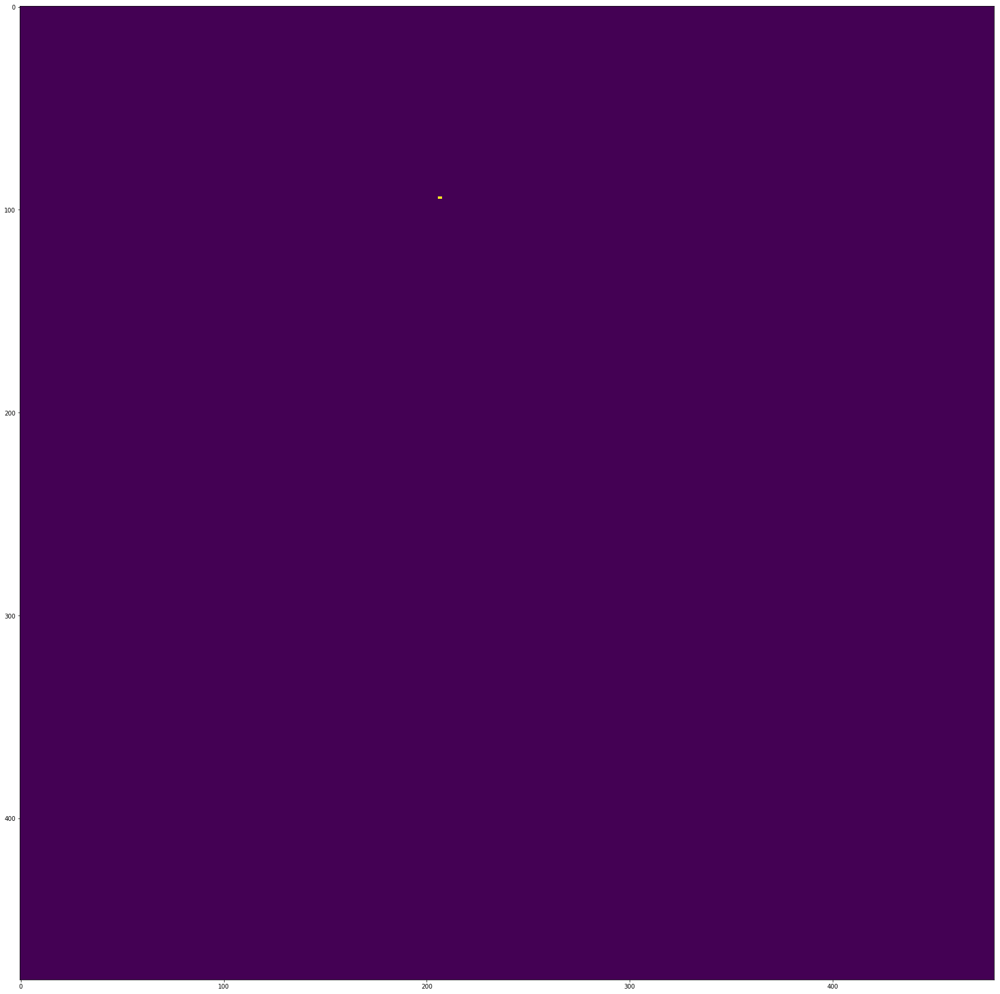

In [9]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=48)
#display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/sample5/dmask_001.tif")[:96, :672, :480].reshape(1, 96, 672, 480, 1), z=48)
display_slice_from_batch(mask, z=48)
#With sep17_largeframe_48_nonzero_standardized_local_overnight on larger data size, with no offset
#psnr100

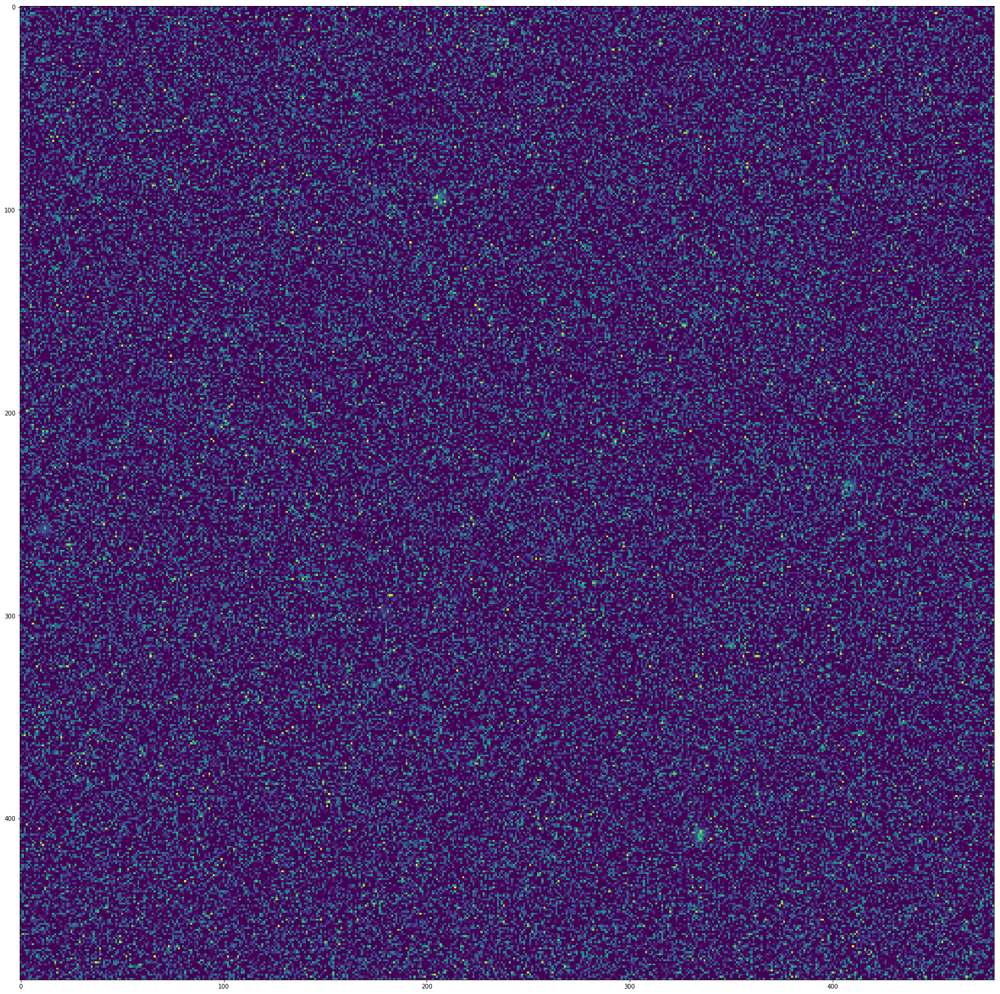

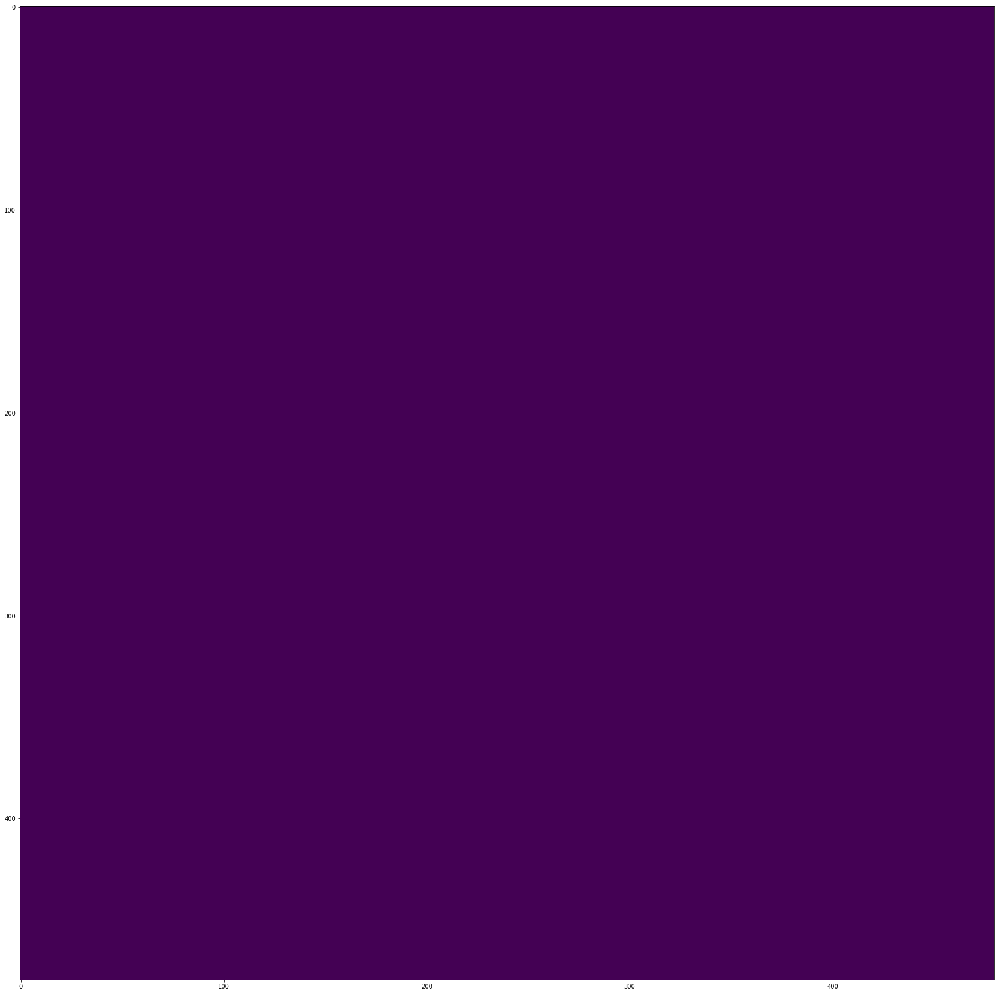

In [6]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:240, :480, :480].reshape(1, 240, 480, 480, 1), z=48)
#display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/sample5/dmask_001.tif")[:96, :672, :480].reshape(1, 96, 672, 480, 1), z=48)
display_slice_from_batch(mask, z=48)
#With sep17_largeframe_48_nonzero_standardized_local_overnight on larger data size, with no offset
#psnr5

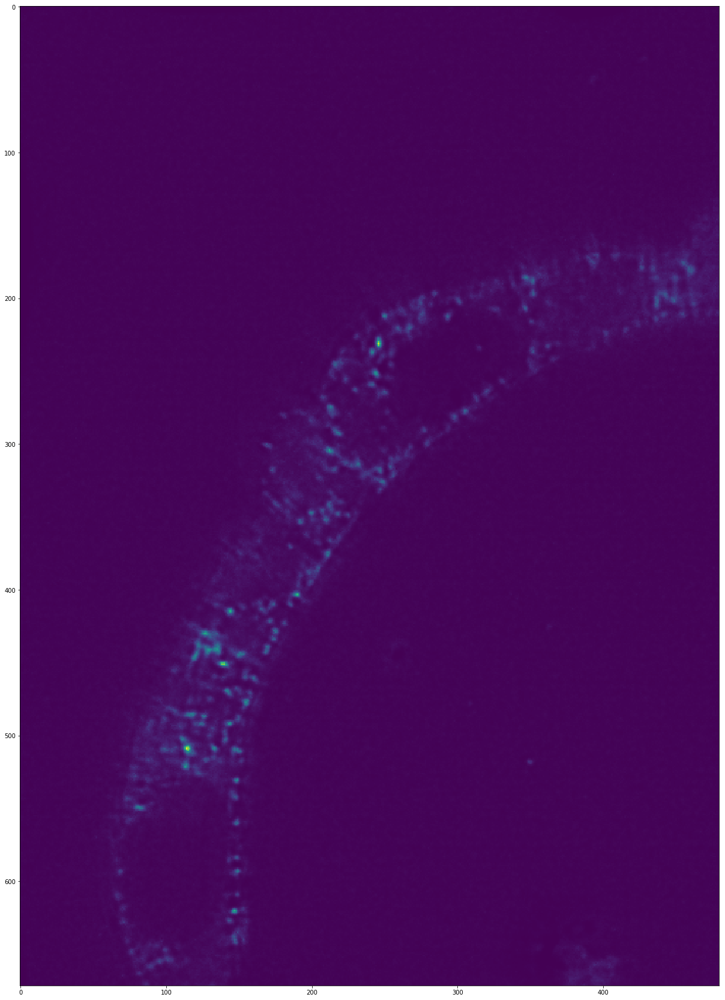

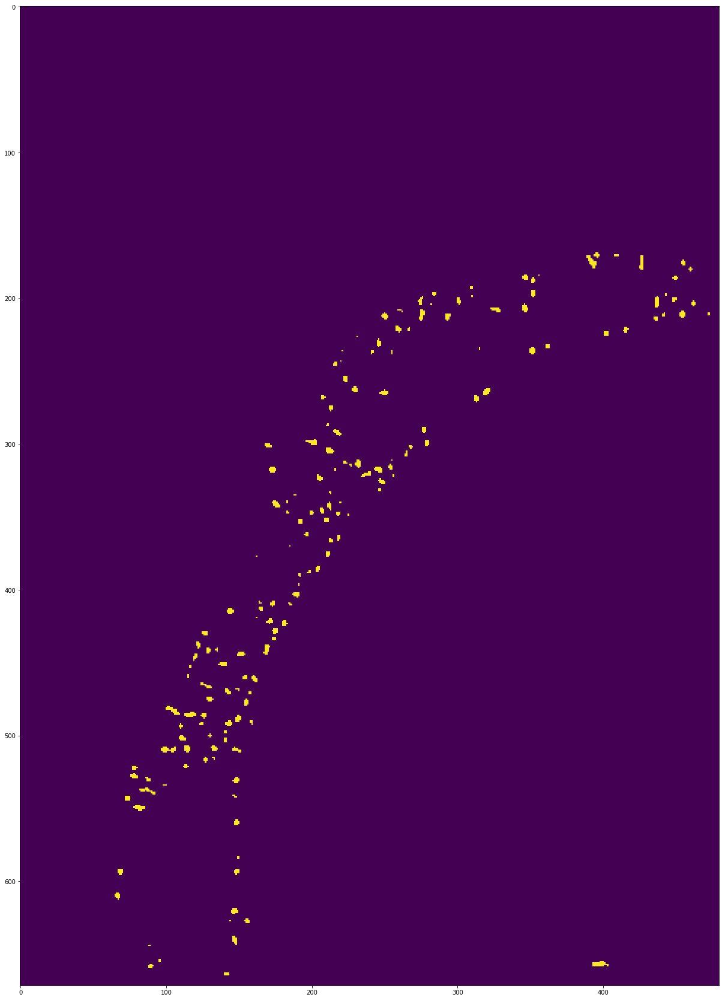

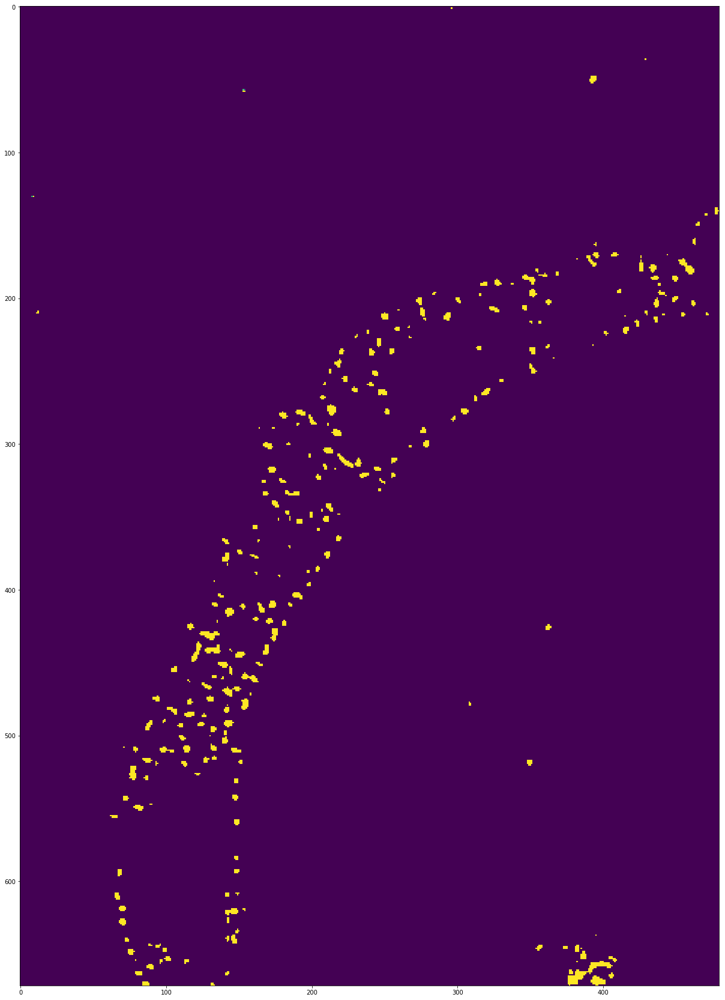

In [5]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:96, :672, :480].reshape(1, 96, 672, 480, 1), z=48)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/sample7/dmask_01.tif")[:96, :672, :480].reshape(1, 96, 672, 480, 1), z=48)
display_slice_from_batch(mask, z=48)
#With sep17_largeframe_48_nonzero_standardized_local_more_epochs on larger data size, with no offset
#sample7

/usr/local/lib/python3.5/dist-packages/skimage/external/tifffile/tifffile.py:2611: RuntimeWarning: py_decodelzw encountered unexpected end of stream
  strip = decompress(strip)


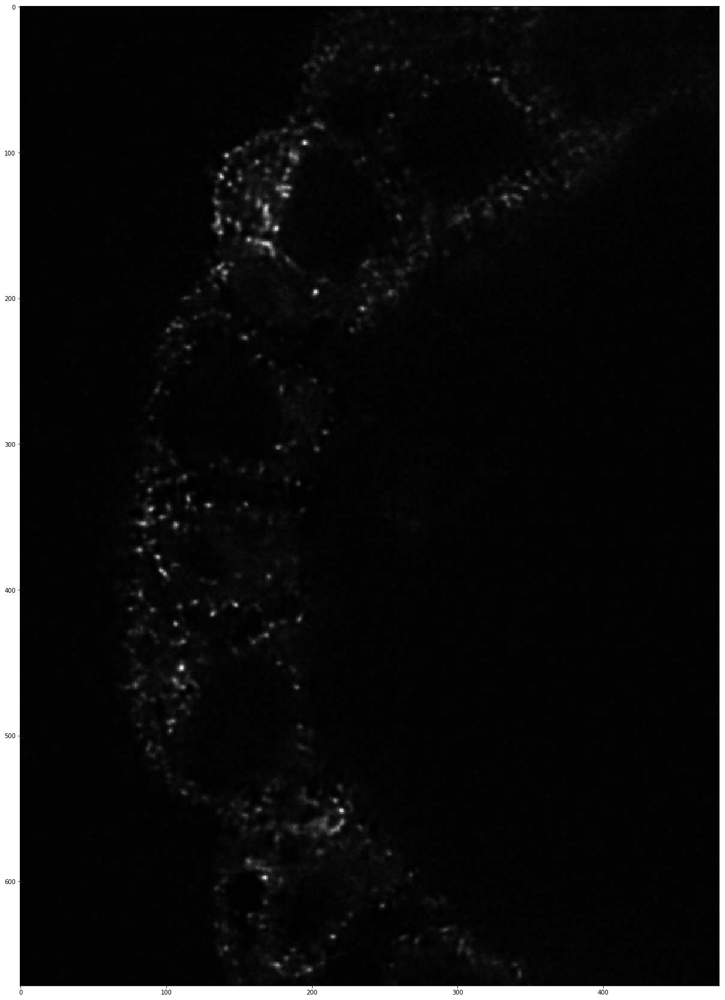

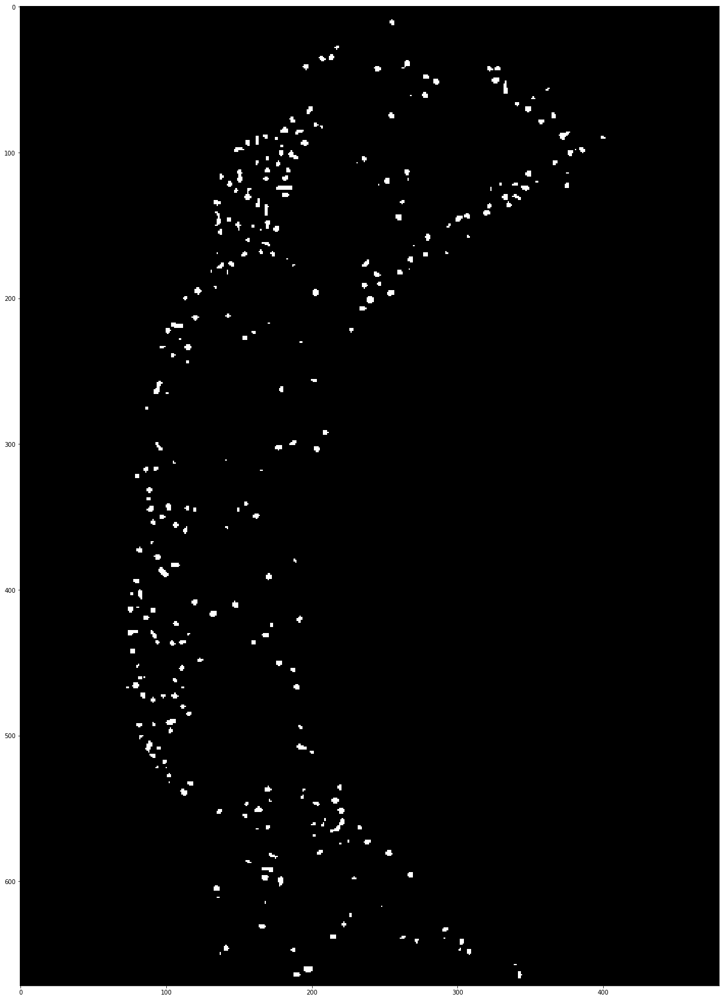

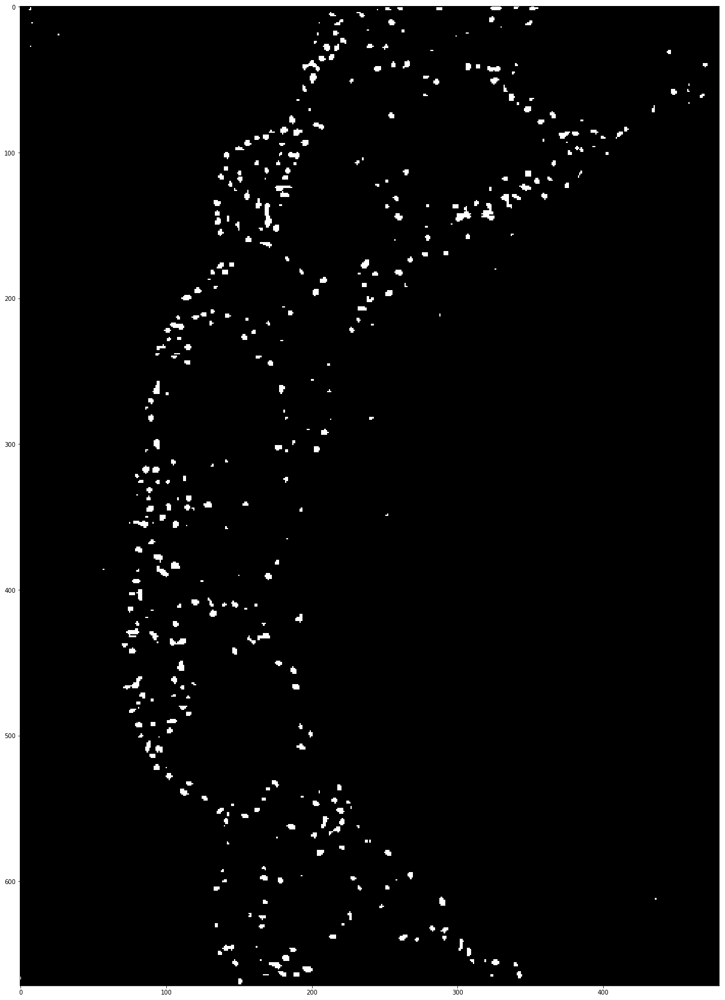

In [23]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:96, :672, :480].reshape(1, 96, 672, 480, 1), z=48)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/sample3/dmask_01.tif")[:96, :672, :480].reshape(1, 96, 672, 480, 1), z=48)
display_slice_from_batch(mask, z=48)
#With sep17_largeframe_48_nonzero_standardized_local_overnight on larger data size, with no offset
#sample3

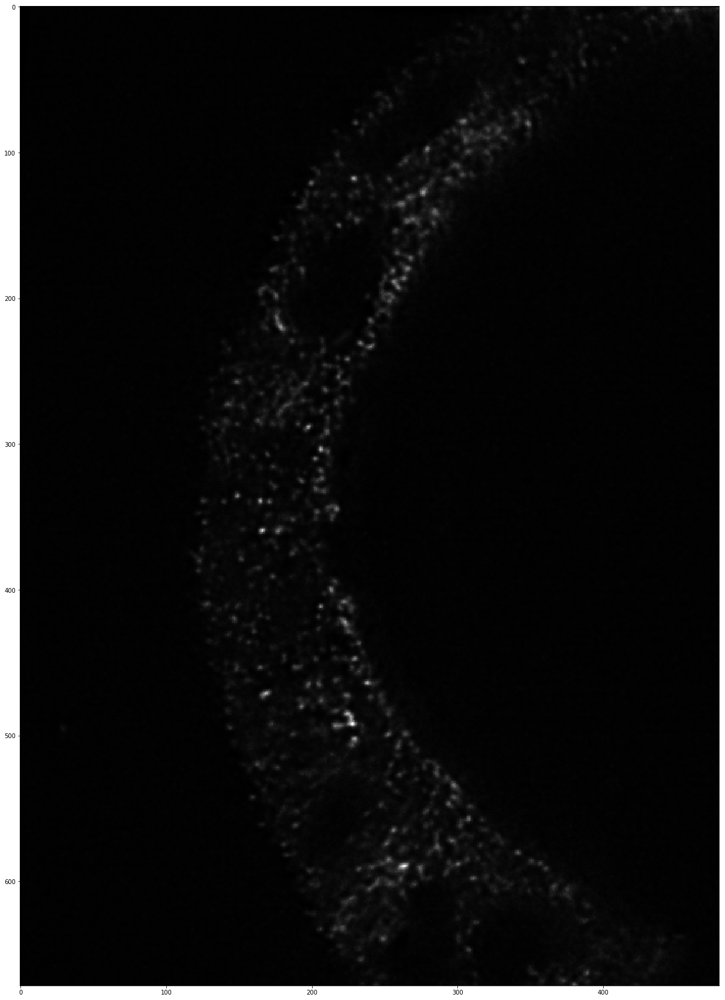

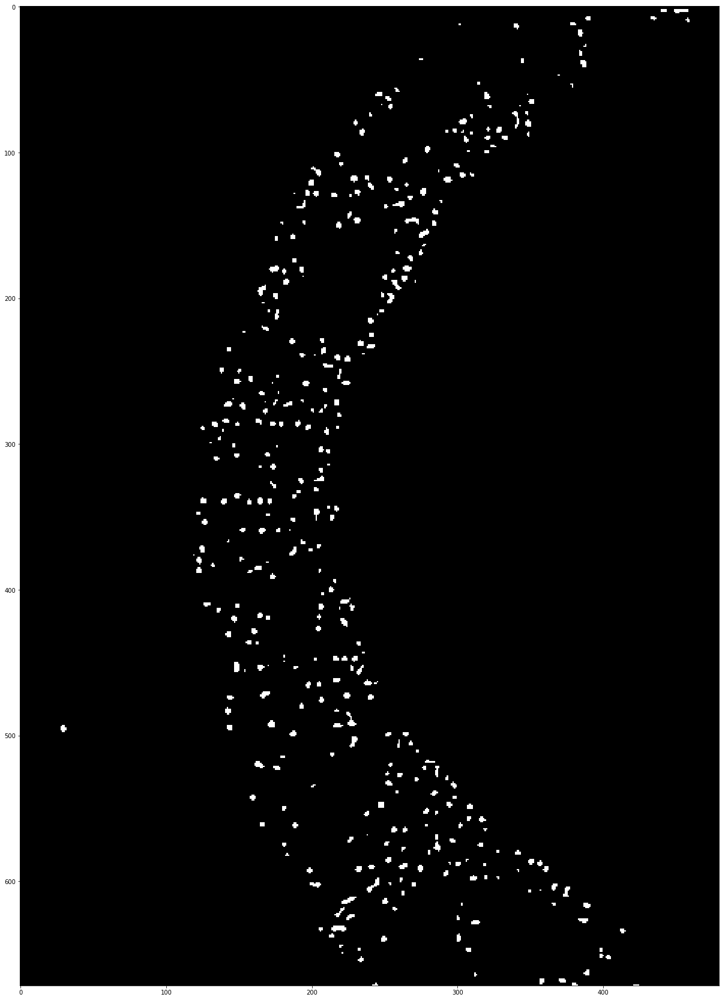

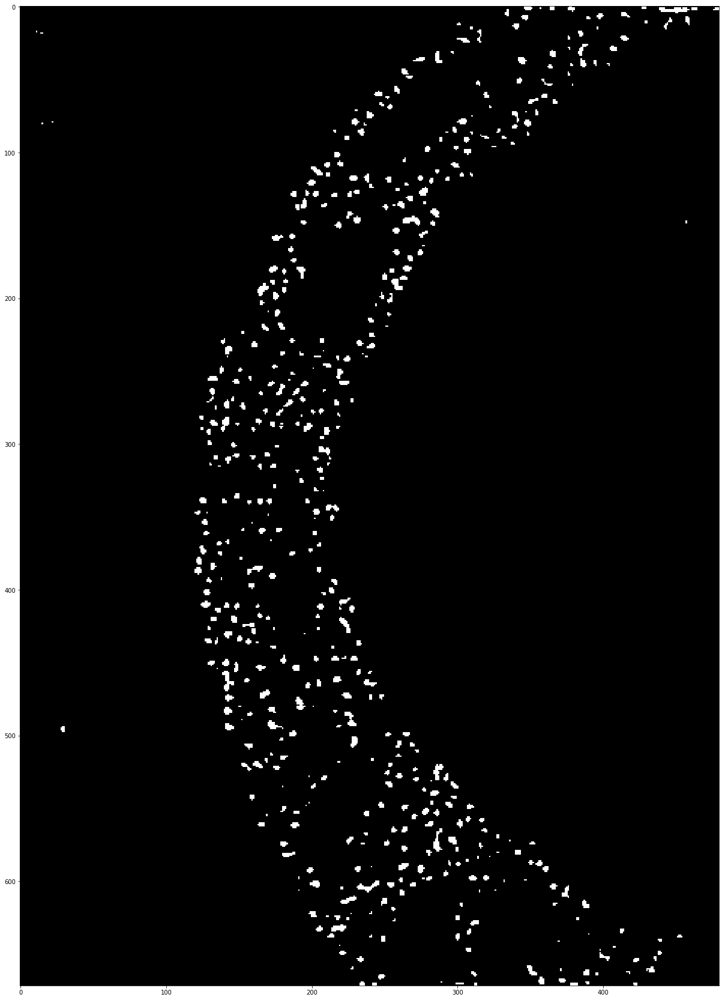

In [27]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:96, :672, :480].reshape(1, 96, 672, 480, 1), z=48)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/sample5/dmask_001.tif")[:96, :672, :480].reshape(1, 96, 672, 480, 1), z=48)
display_slice_from_batch(mask, z=48)
#With sep17_largeframe_48_nonzero_standardized_local_overnight on larger data size, with no offset
#sample5

/usr/local/lib/python3.5/dist-packages/skimage/external/tifffile/tifffile.py:2611: RuntimeWarning: py_decodelzw encountered unexpected end of stream
  strip = decompress(strip)


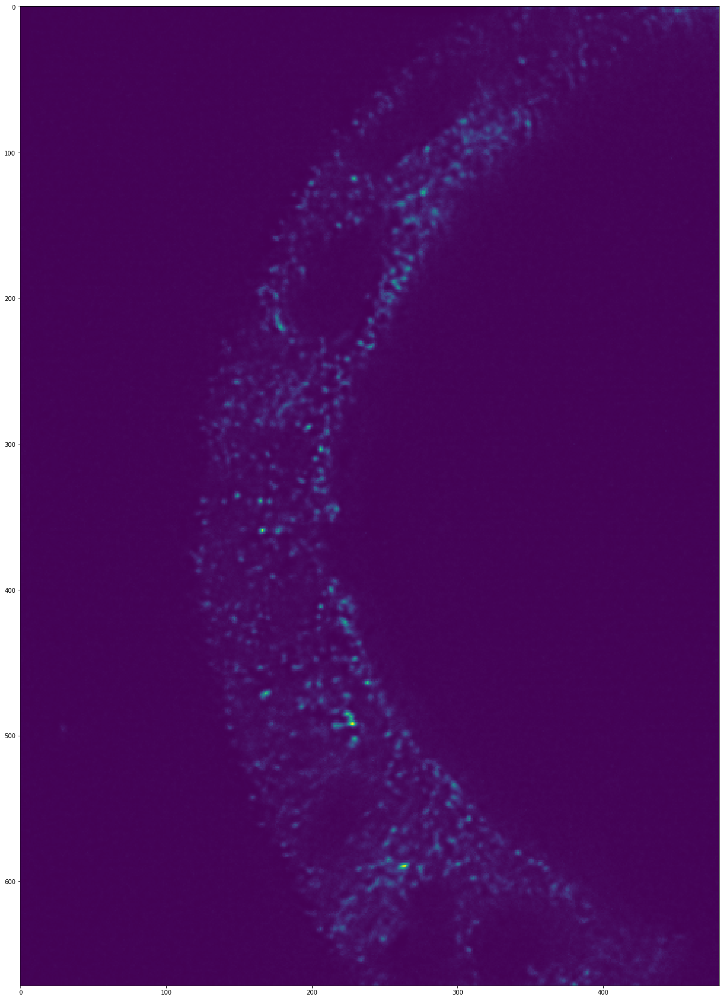

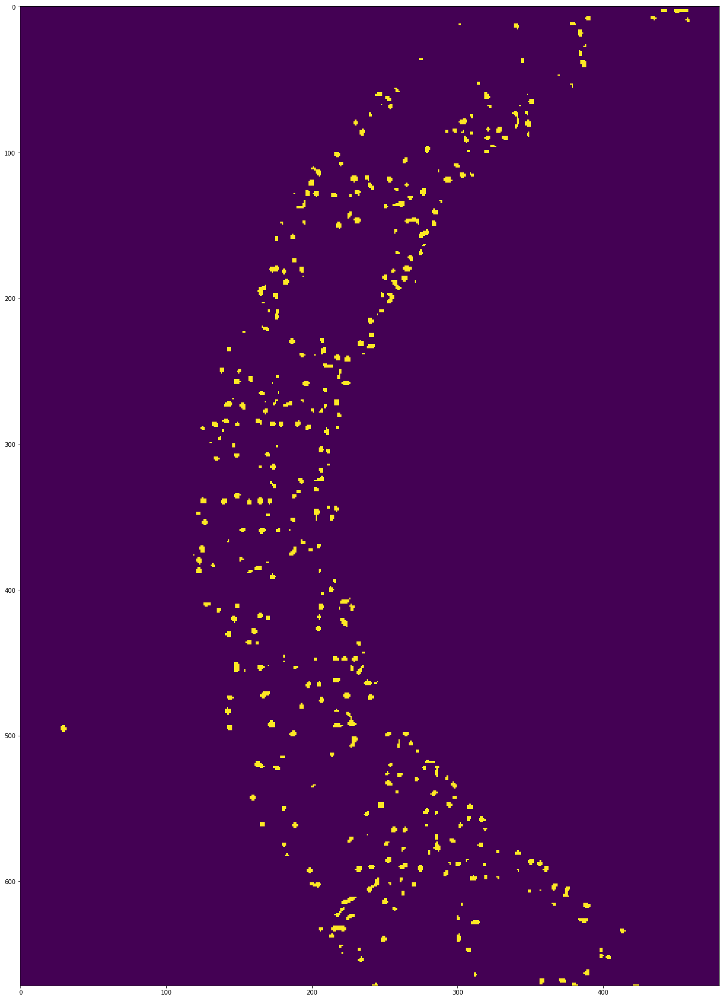

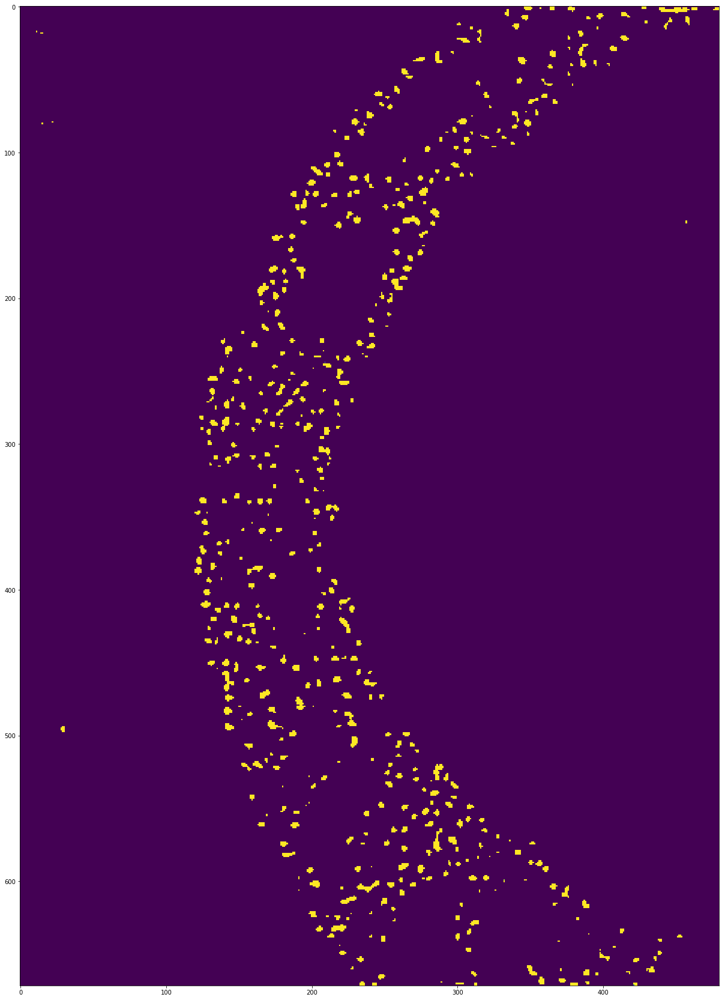

In [5]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:96, :672, :480].reshape(1, 96, 672, 480, 1), z=48)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/sample5/dmask_001.tif")[:96, :672, :480].reshape(1, 96, 672, 480, 1), z=48)
display_slice_from_batch(mask, z=48)
#With sep17_largeframe_48_nonzero_standardized_local_overnight on larger data size, with no offset
#sample5

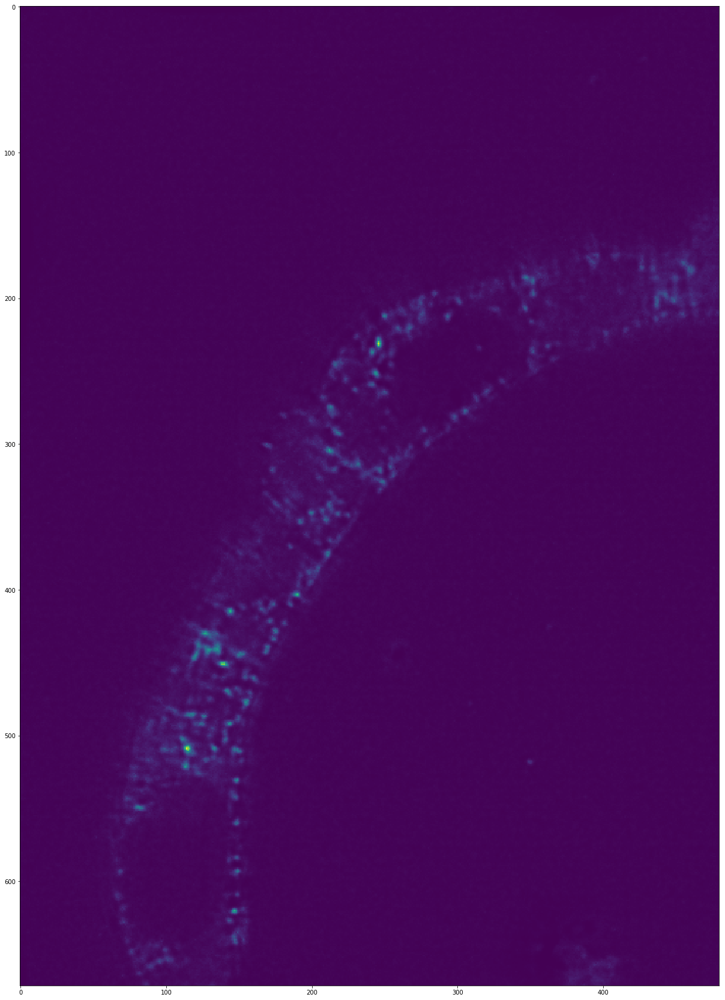

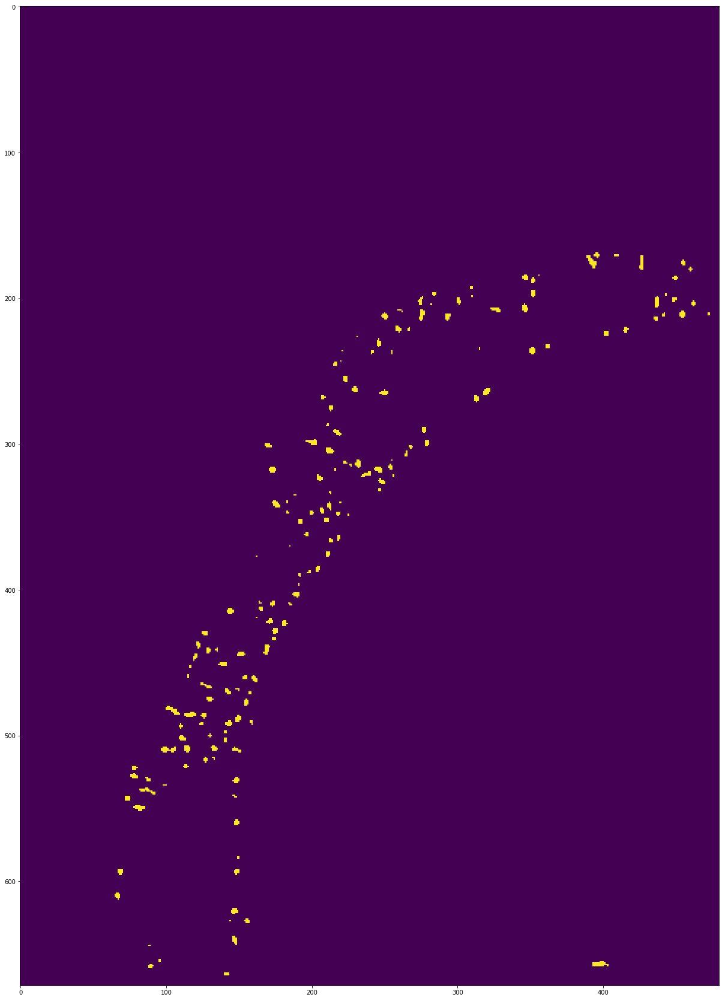

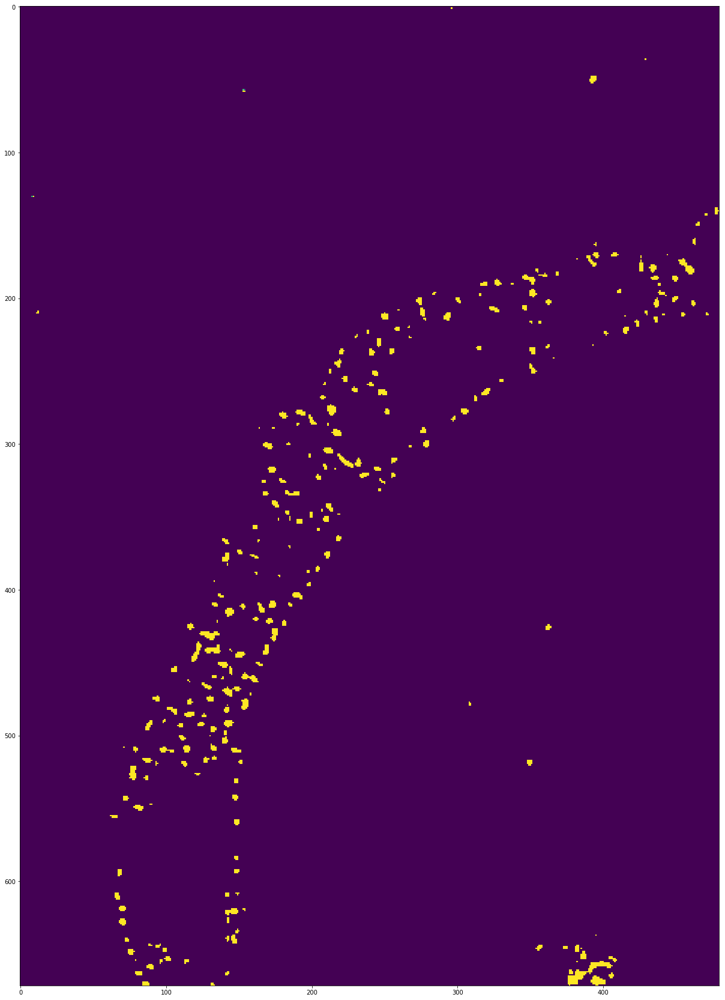

In [19]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:96, :672, :480].reshape(1, 96, 672, 480, 1), z=48)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/sample7/dmask_01.tif")[:96, :672, :480].reshape(1, 96, 672, 480, 1), z=48)
display_slice_from_batch(mask, z=48)
#With sep17_largeframe_48_nonzero_standardized_local_more_epochs on larger data size, with no offset
#sample7

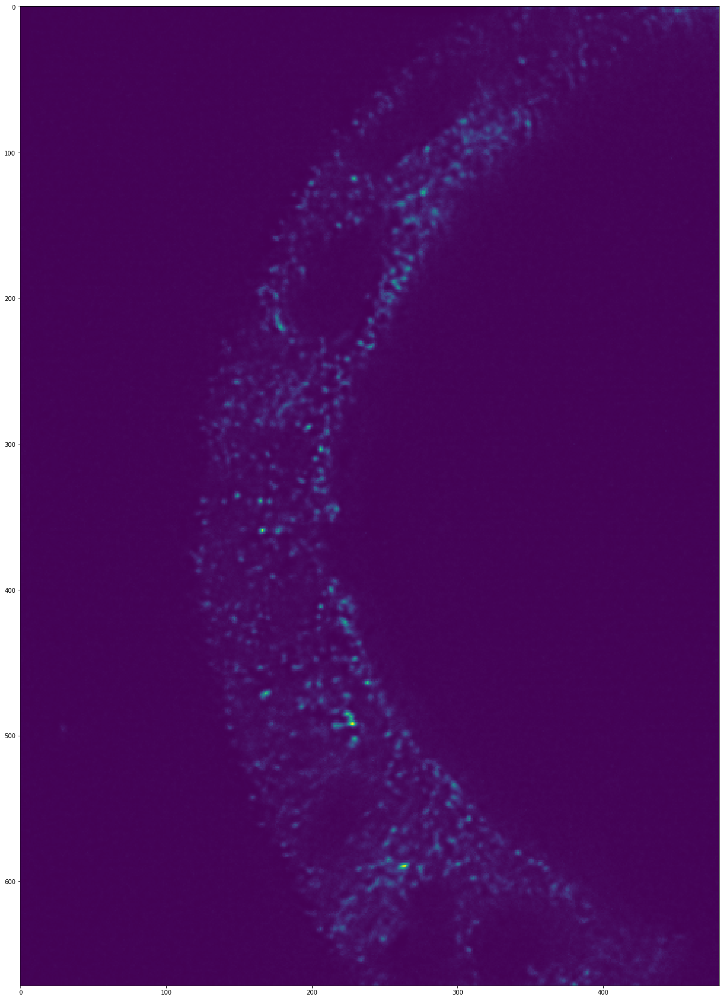

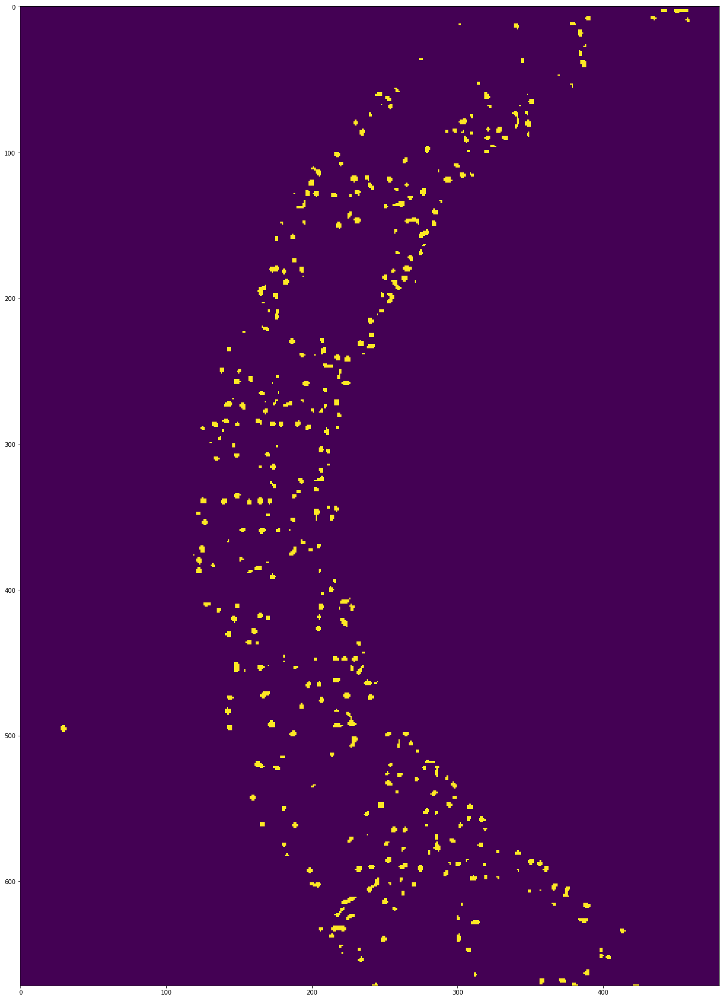

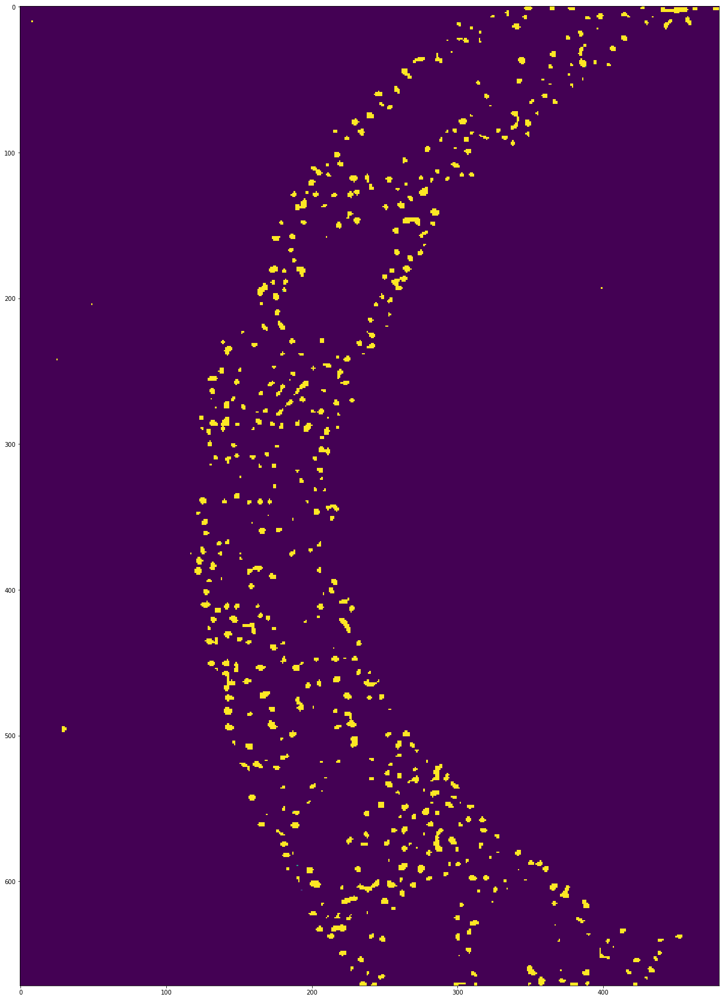

In [16]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:96, :672, :480].reshape(1, 96, 672, 480, 1), z=48)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/sample5/dmask_001.tif")[:96, :672, :480].reshape(1, 96, 672, 480, 1), z=48)
display_slice_from_batch(mask, z=48)
#With sep17_largeframe_48_nonzero_standardized_local_more_epochs on larger data size, with no offset
#sample5

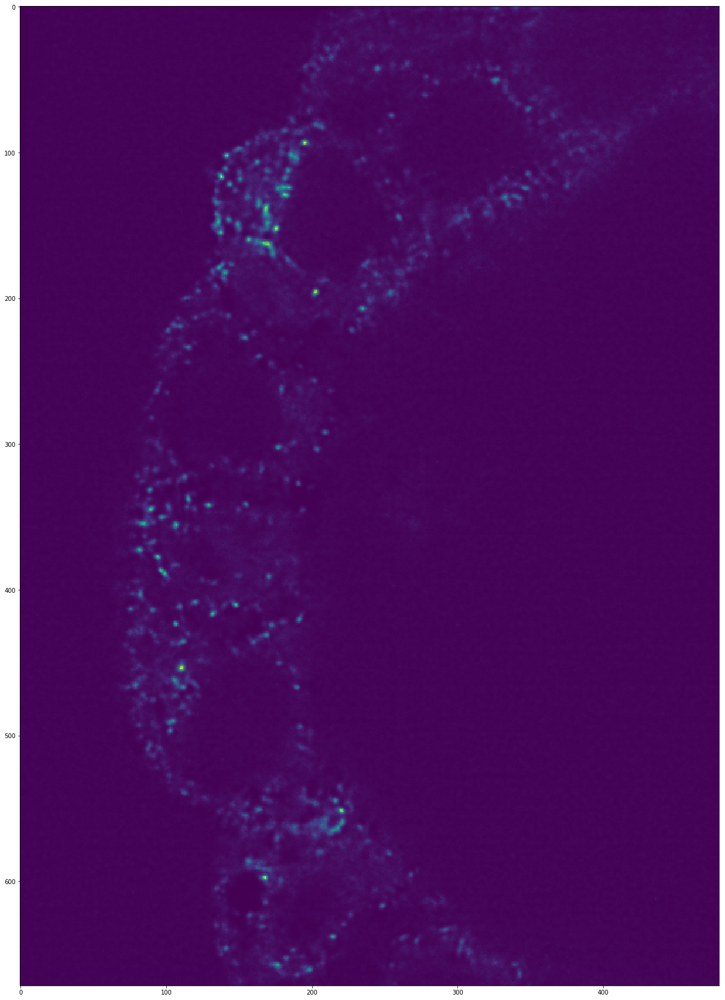

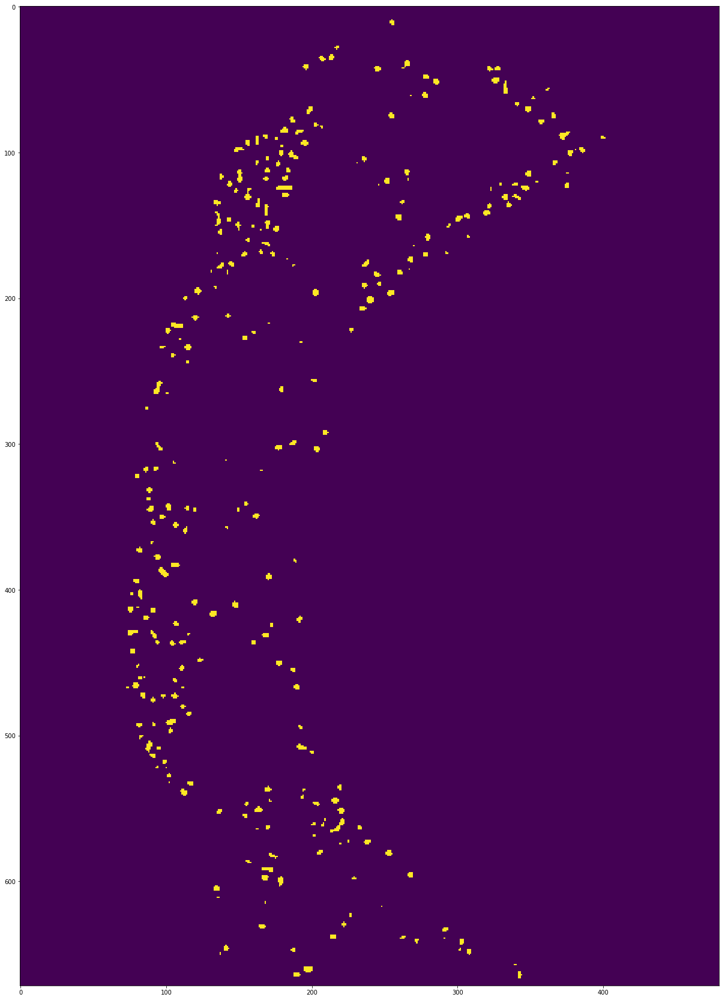

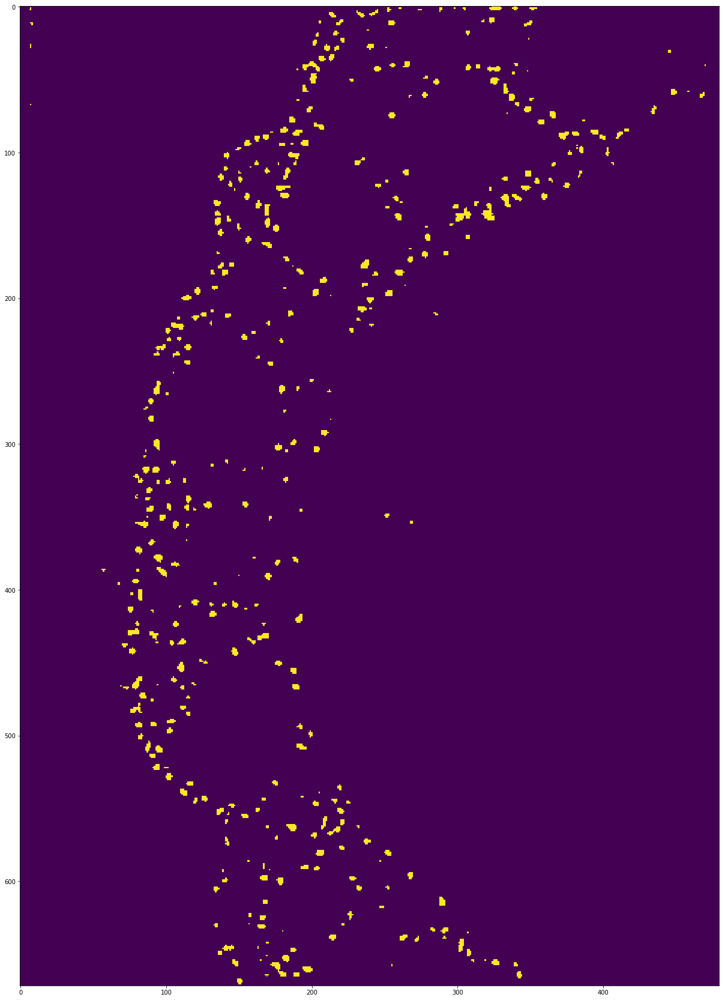

In [10]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:96, :672, :480].reshape(1, 96, 672, 480, 1), z=48)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/sample3/dmask_01.tif")[:96, :672, :480].reshape(1, 96, 672, 480, 1), z=48)
display_slice_from_batch(mask, z=48)
#With sep17_largeframe_48_nonzero_standardized_local_more_epochs on larger data size, with no offset
#sample3

/usr/local/lib/python3.5/dist-packages/skimage/external/tifffile/tifffile.py:2611: RuntimeWarning: py_decodelzw encountered unexpected end of stream
  strip = decompress(strip)


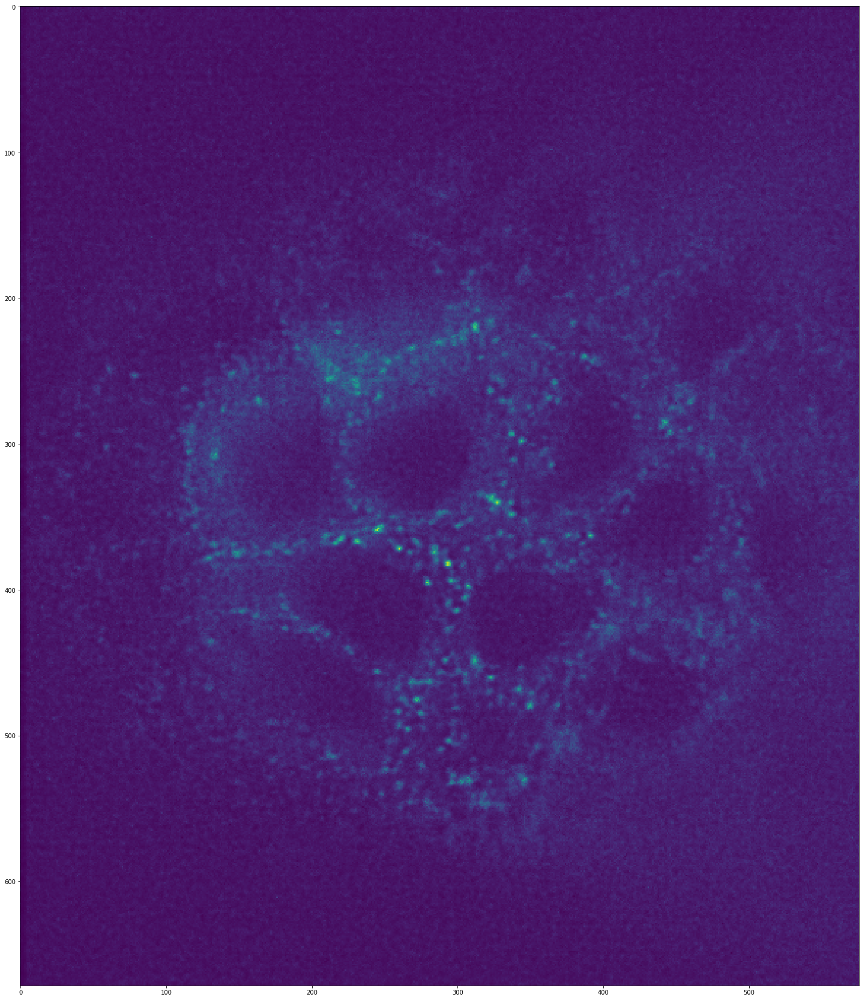

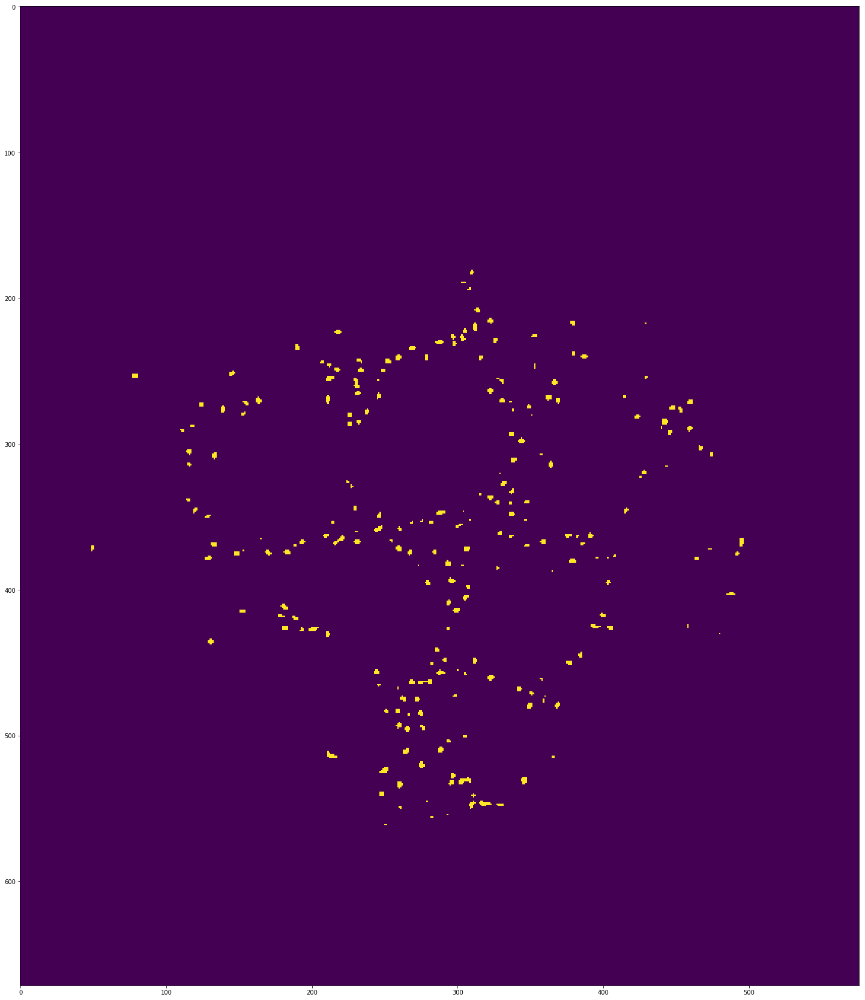

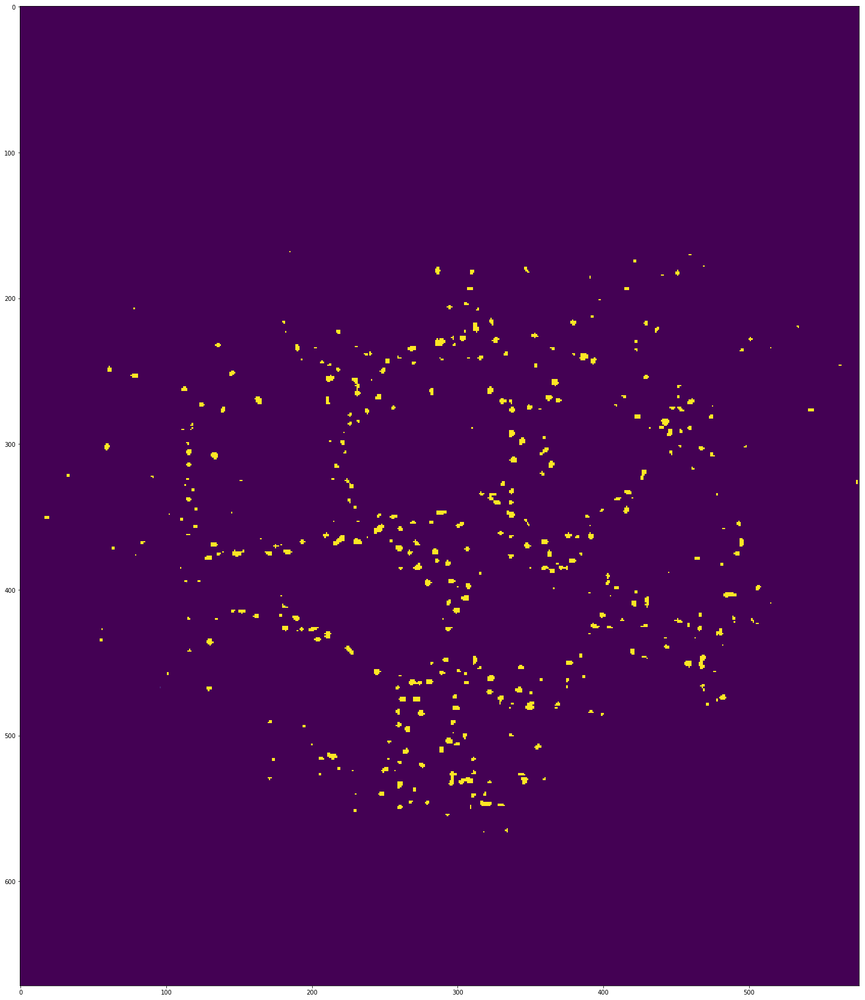

In [5]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:192, :672, :576].reshape(1, 192, 672, 576, 1), z=48)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/extras/dmask_02.tif")[:192, :672, :576].reshape(1, 192, 672, 576, 1), z=48)
display_slice_from_batch(mask, z=48)
#With sep17_largeframe_48_nonzero_standardized_local_more_epochs on larger data size, with no offset

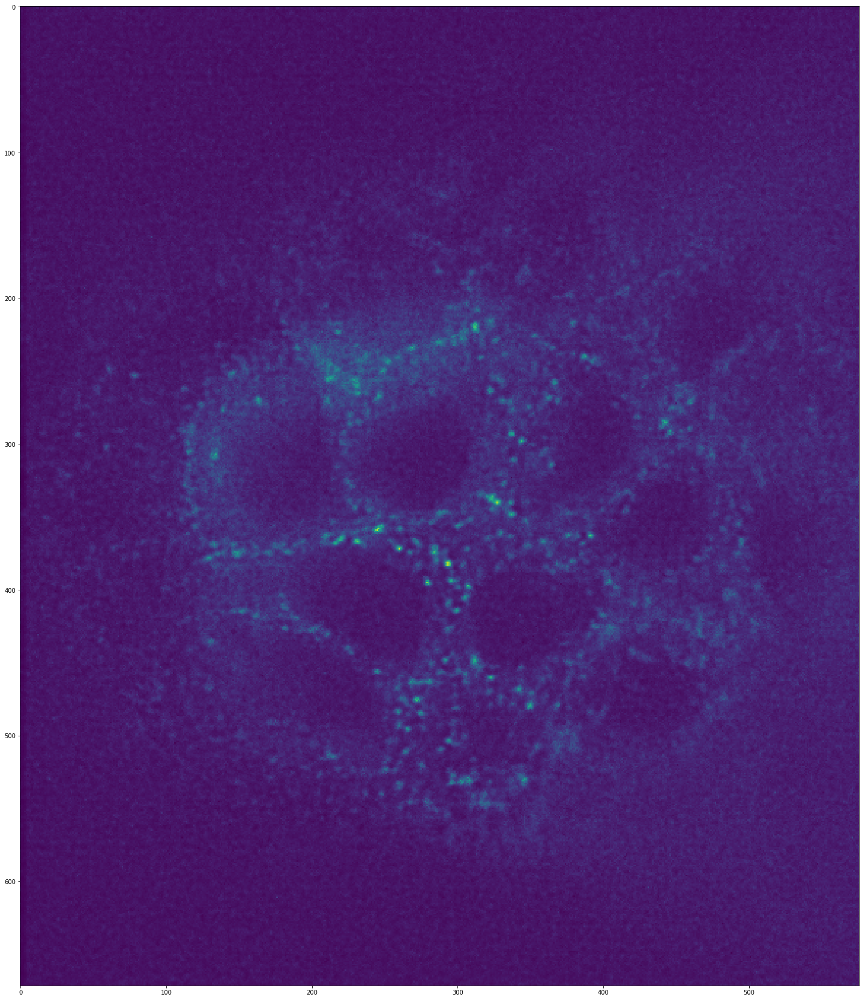

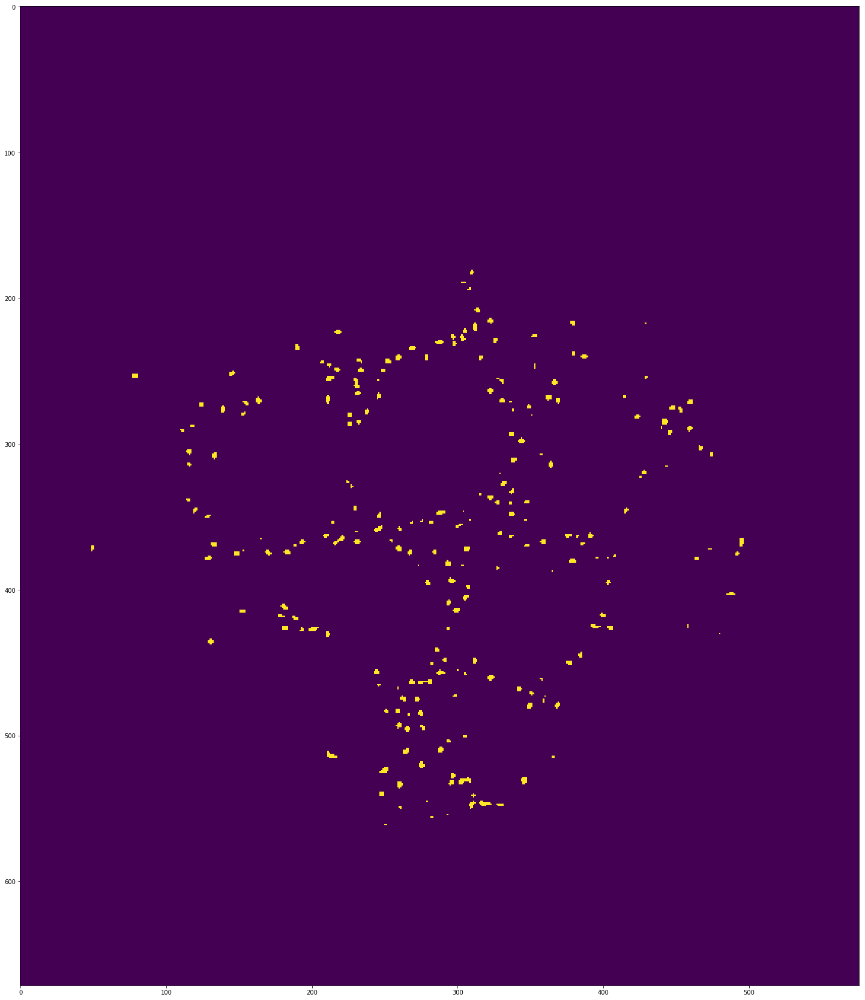

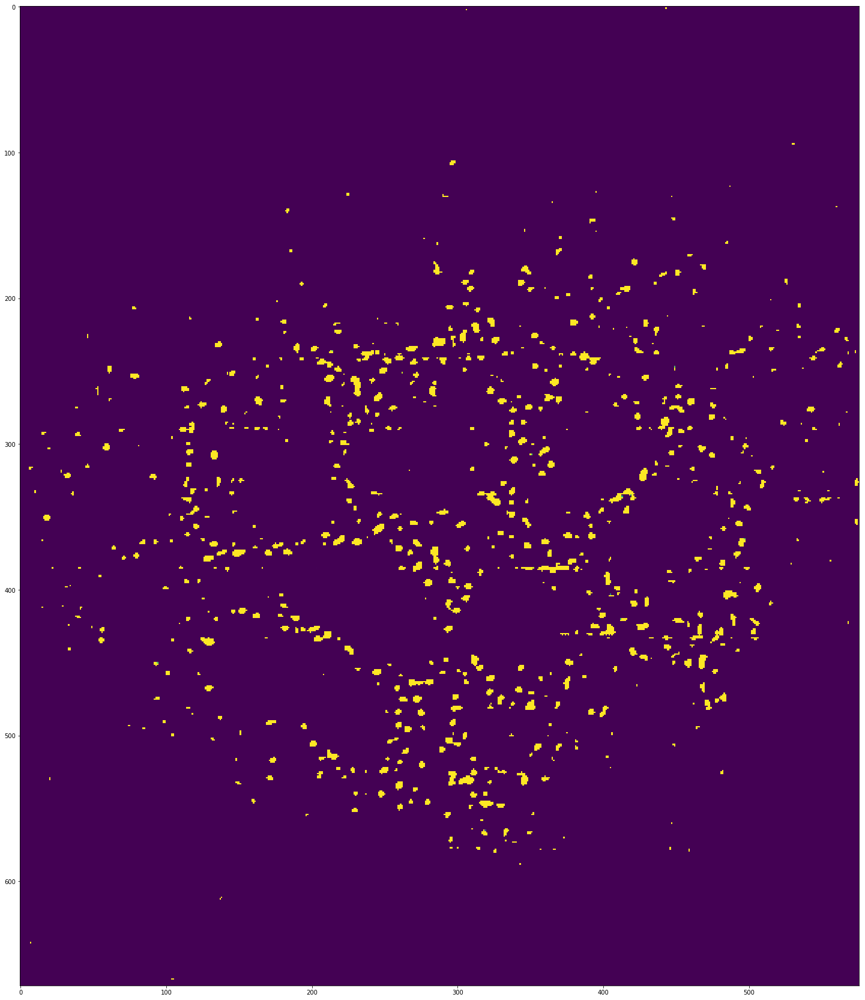

In [9]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:192, :672, :576].reshape(1, 192, 672, 576, 1), z=48)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/extras/dmask_02.tif")[:192, :672, :576].reshape(1, 192, 672, 576, 1), z=48)
display_slice_from_batch(mask, z=48)
#With sep17_largeframe_48_nonzero_standardized_global_more_epochs on larger data size, with offset of 0 and 0

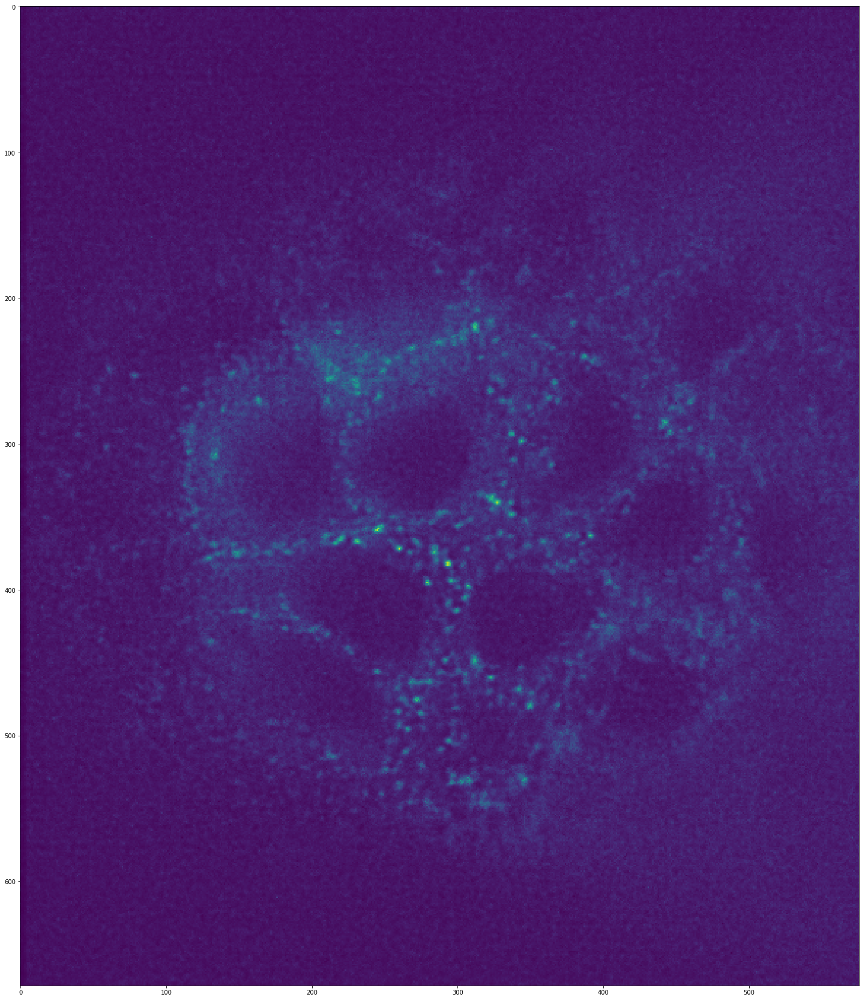

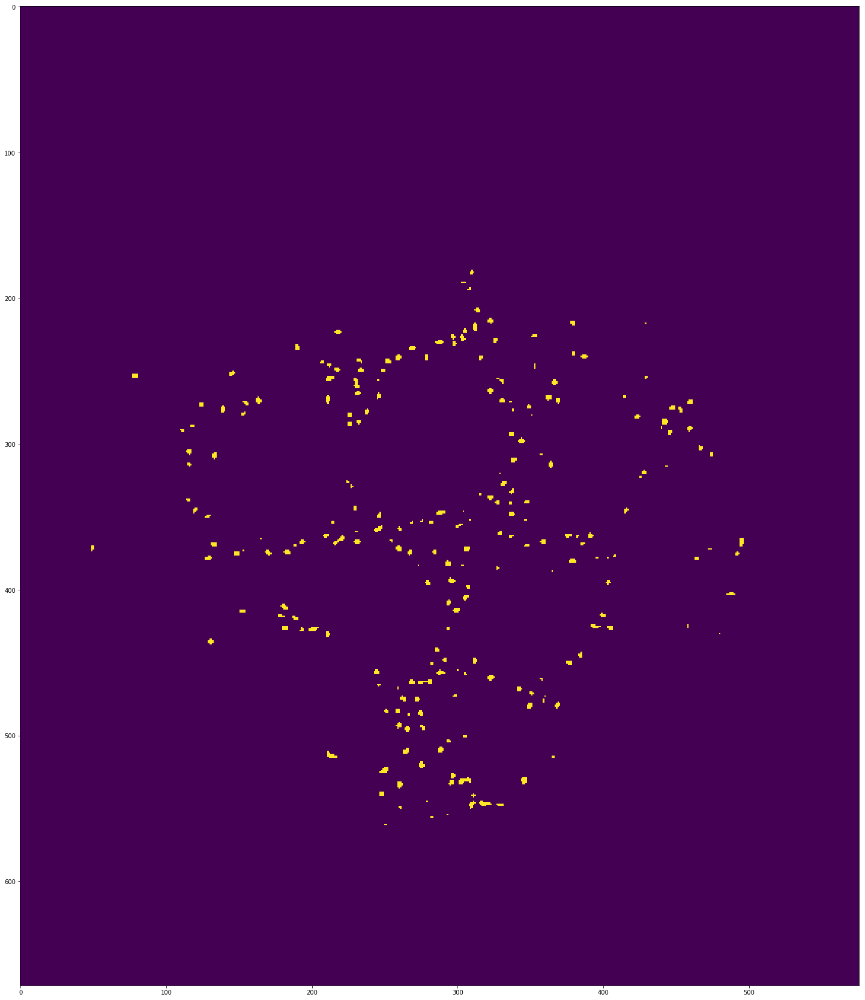

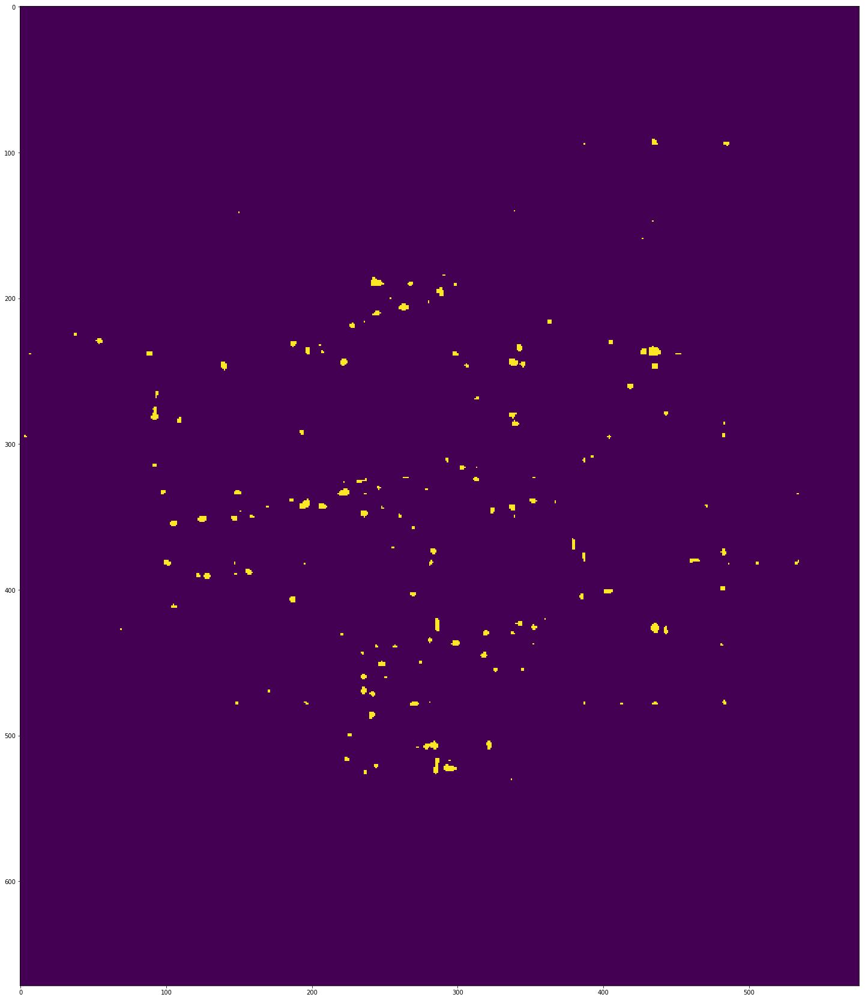

In [8]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:192, :672, :576].reshape(1, 192, 672, 576, 1), z=48)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/extras/dmask_02.tif")[:192, :672, :576].reshape(1, 192, 672, 576, 1), z=48)
display_slice_from_batch(mask, z=48)
#With jul21_48_nonzero_standardized_global on larger data size, with offset of 24 in 2nd dim AND 3rd dim

/usr/local/lib/python3.5/dist-packages/skimage/external/tifffile/tifffile.py:2611: RuntimeWarning: py_decodelzw encountered unexpected end of stream
  strip = decompress(strip)


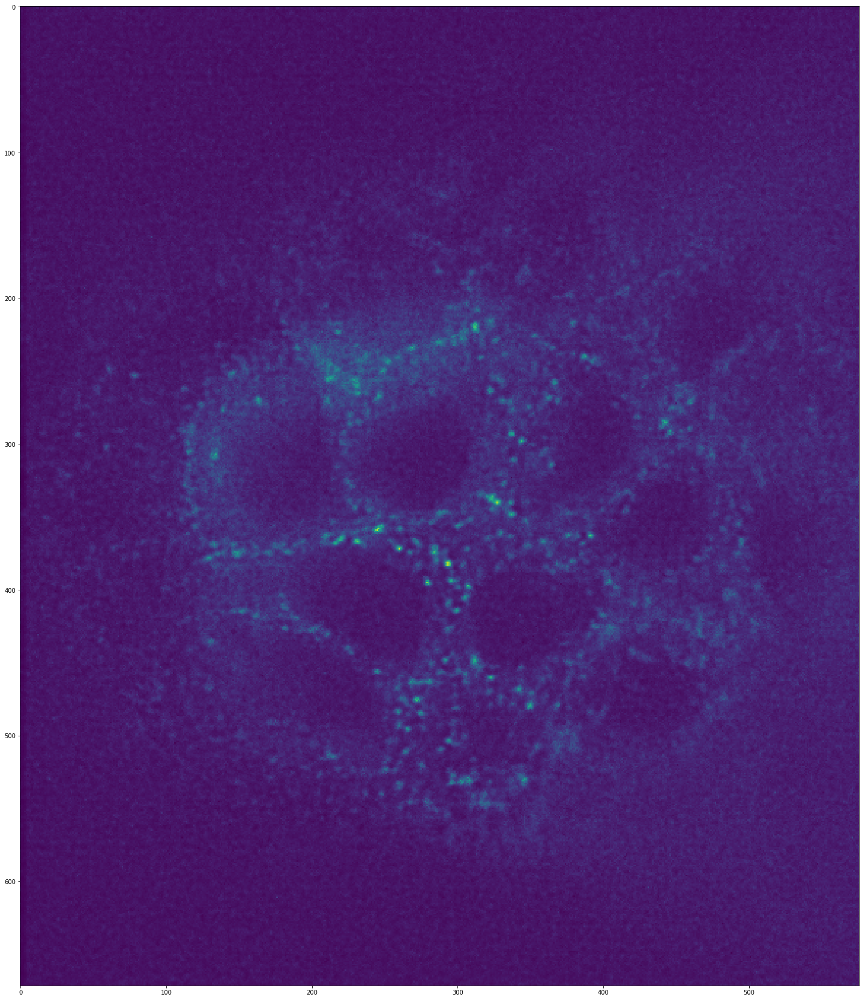

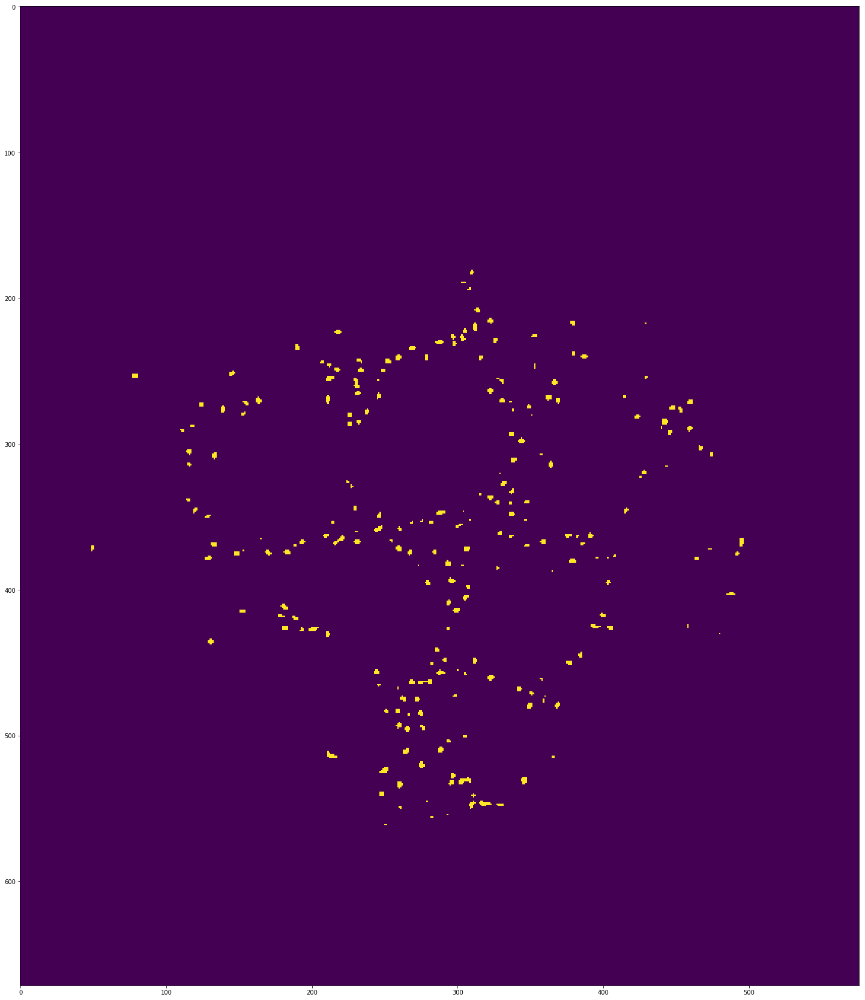

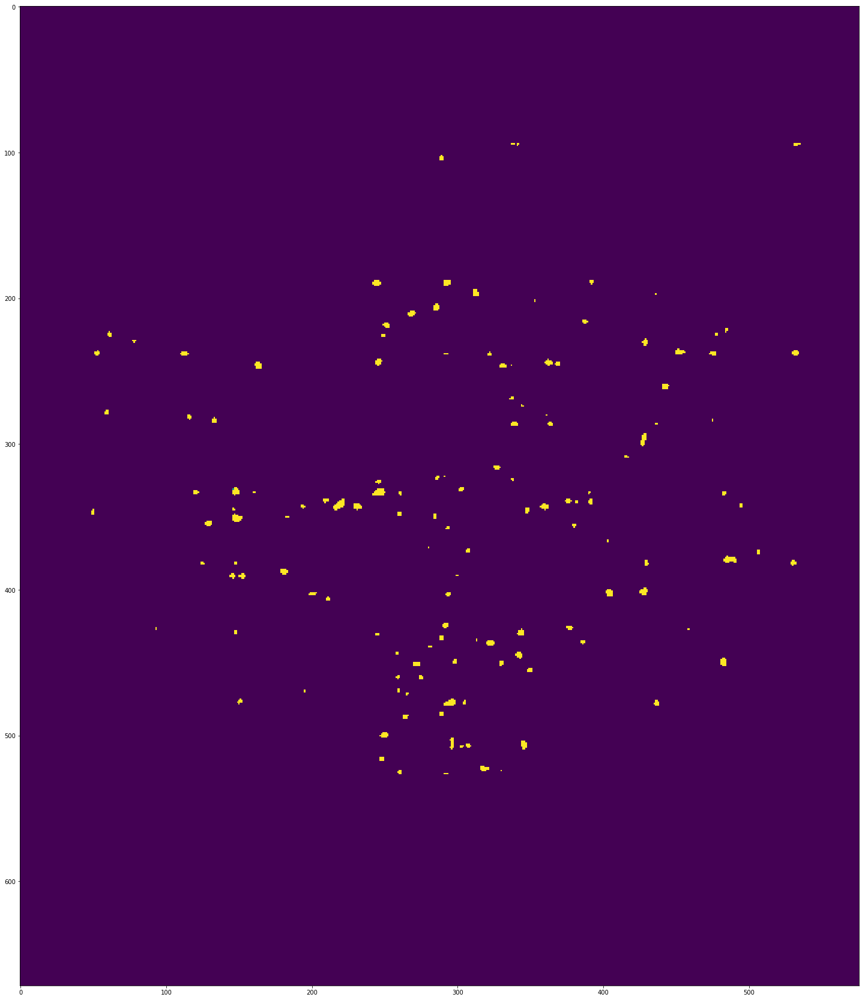

In [9]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:192, :672, :576].reshape(1, 192, 672, 576, 1), z=48)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/extras/dmask_02.tif")[:192, :672, :576].reshape(1, 192, 672, 576, 1), z=48)
display_slice_from_batch(mask, z=48)
#With jul21_48_nonzero_standardized_global on larger data size, with offset of 24 in 2nd dim

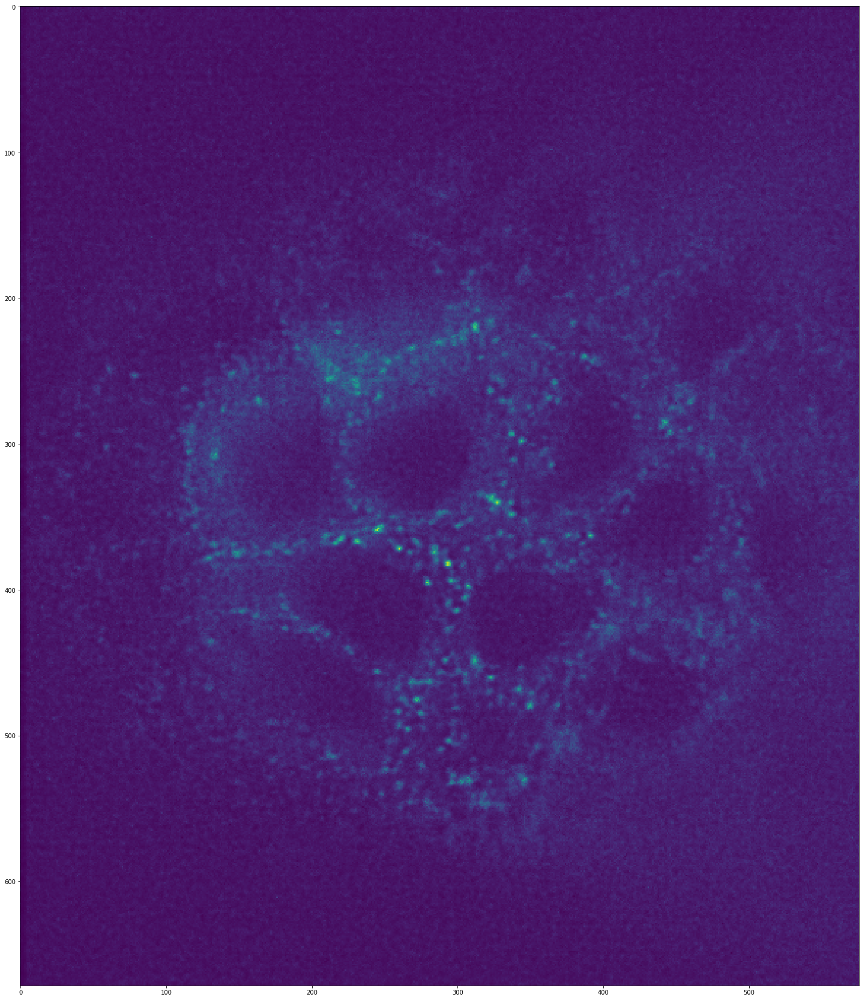

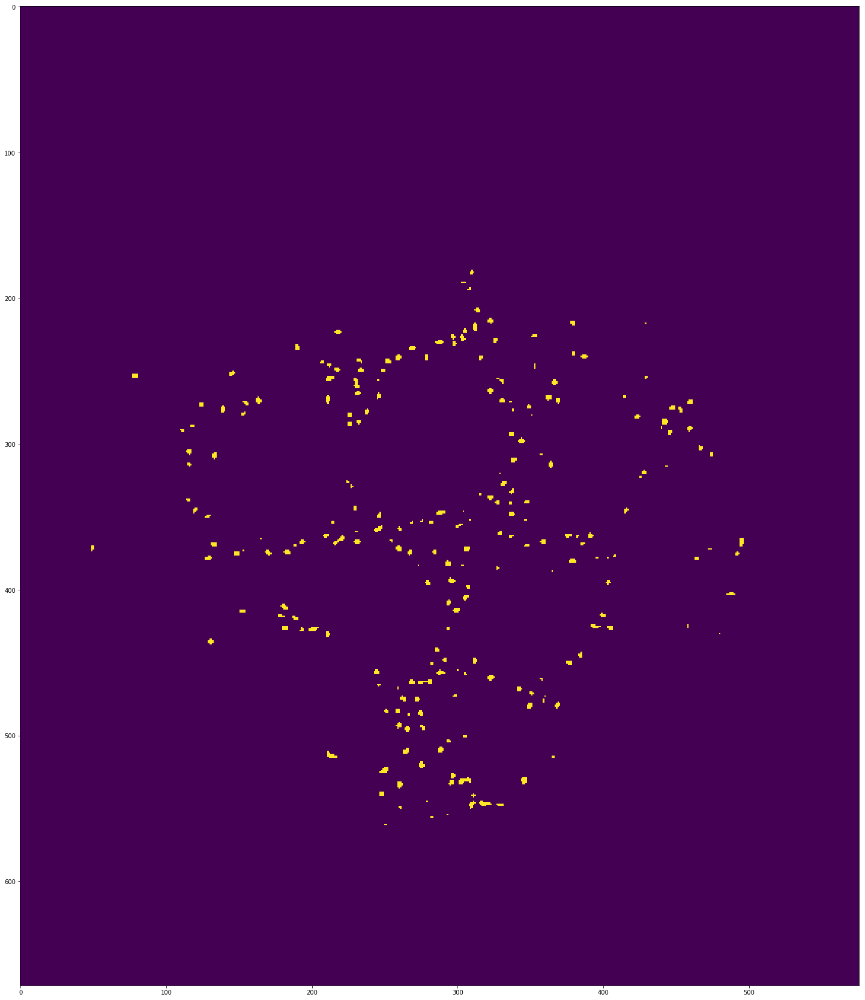

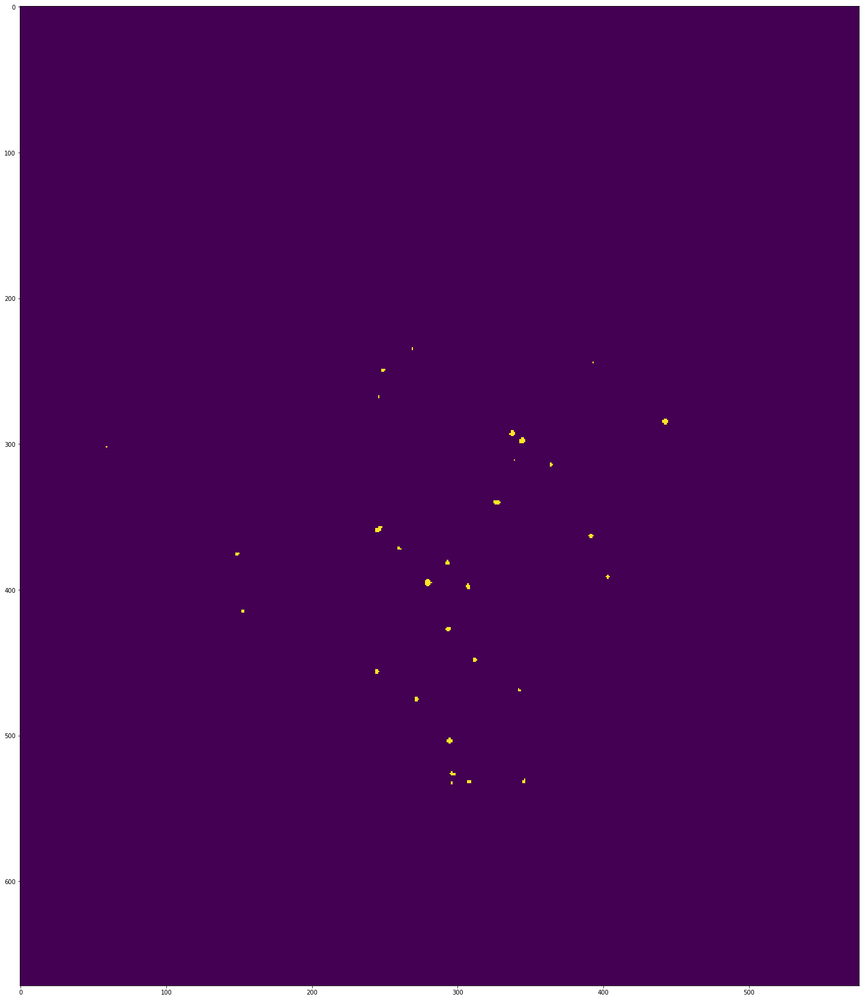

In [16]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:192, :672, :576].reshape(1, 192, 672, 576, 1), z=48)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/extras/dmask_02.tif")[:192, :672, :576].reshape(1, 192, 672, 576, 1), z=48)
display_slice_from_batch(mask, z=48)
#With jul21_48_nonzero_standardized on larger data size

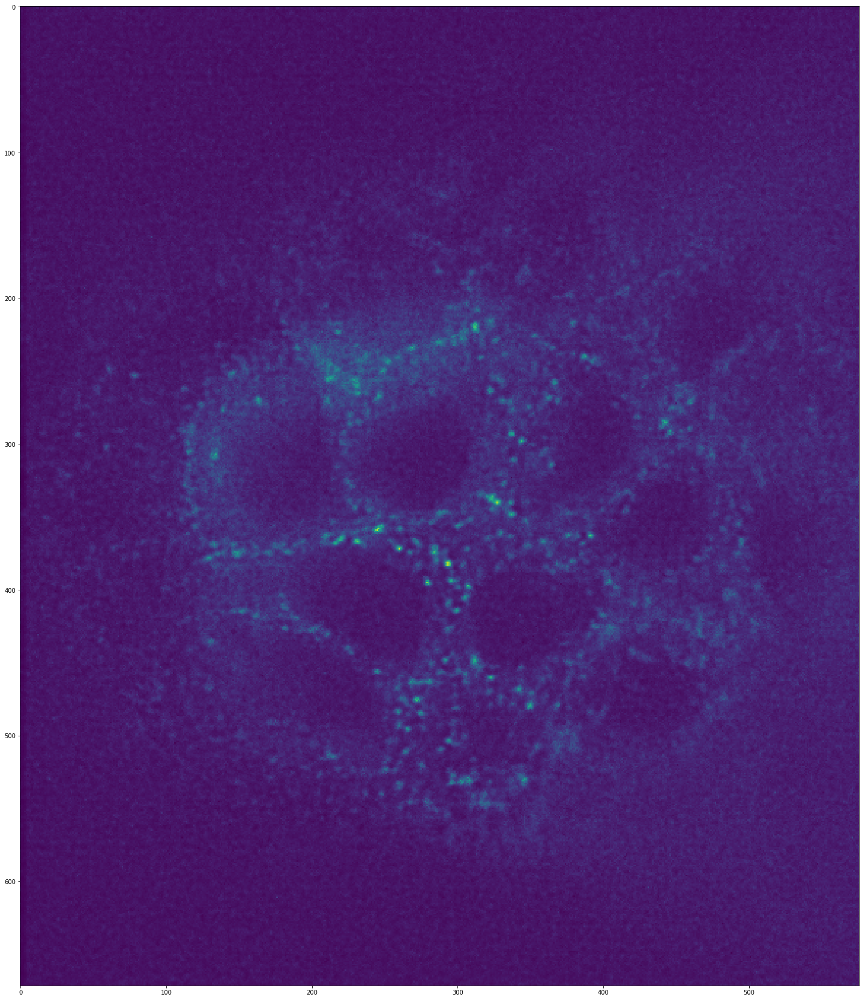

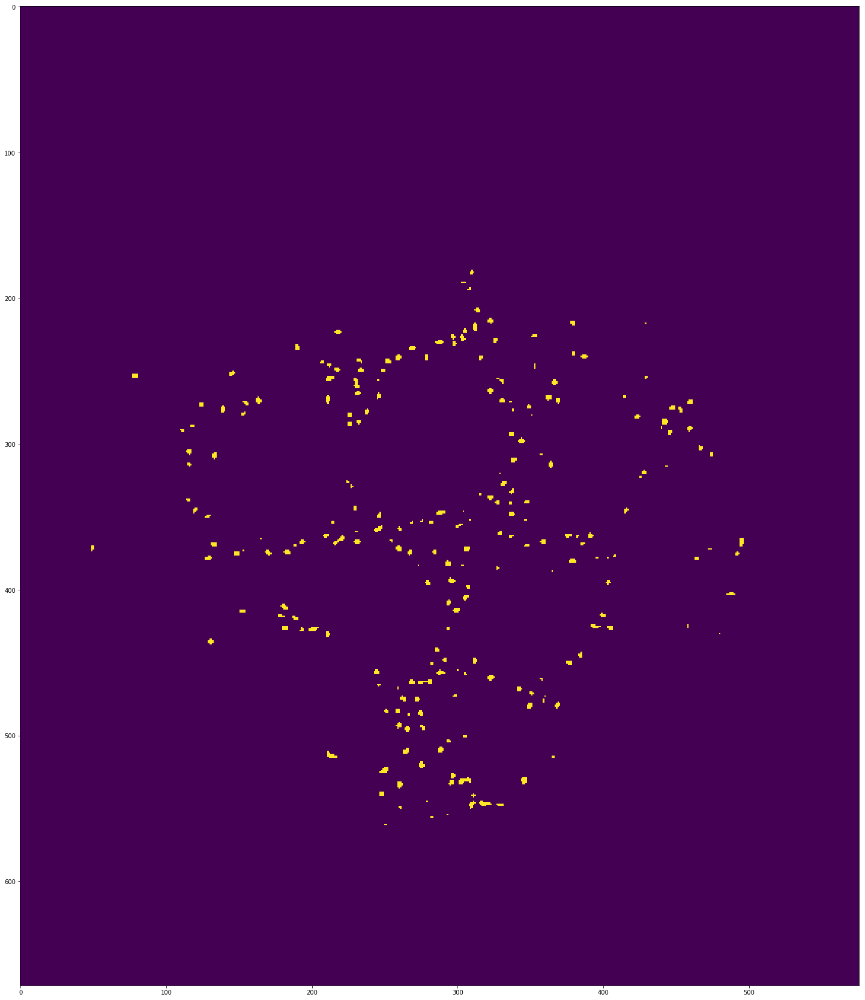

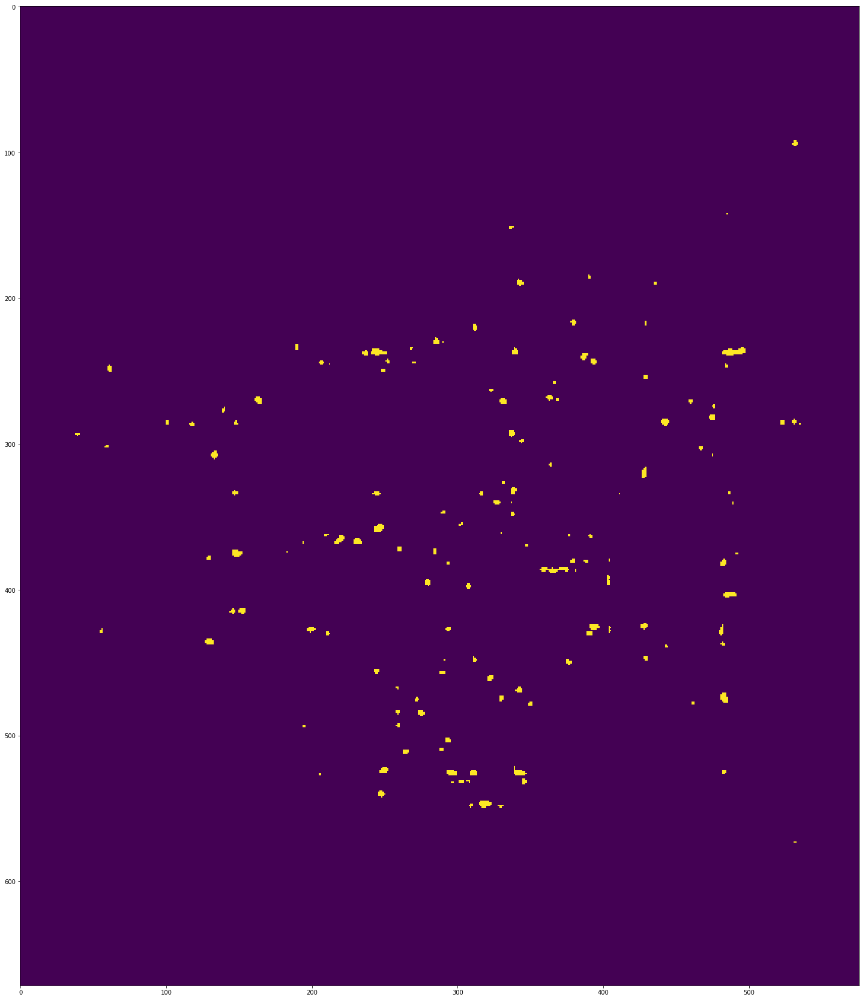

In [10]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 30]

display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:192, :672, :576].reshape(1, 192, 672, 576, 1), z=48)
display_slice_from_batch(skimage.external.tifffile.imread("/home/gauthamar11/pyLattice2/src/tensorflow/quickUnet/dataset/extras/dmask_02.tif")[:192, :672, :576].reshape(1, 192, 672, 576, 1), z=48)
display_slice_from_batch(mask, z=48)
#With jul21_48_nonzero_standardized_global on larger data size

In [3]:
#ONLY RUN FOR CUBE PREDICTIONS
mask = predict_mask(model, image_path, image_size, patch_size)

NameError: name 'model' is not defined

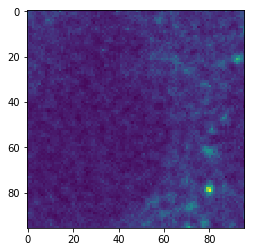

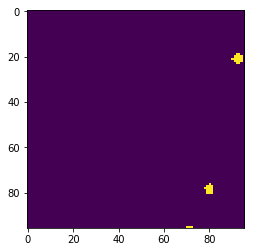

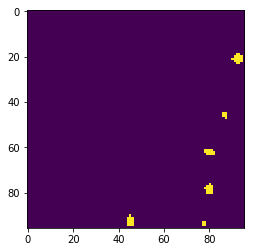

In [5]:
display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:image_size, :image_size, :image_size].reshape(1, 96, 96, 96, 1))
display_slice_from_batch(skimage.external.tifffile.imread("dataset/train/Frame2/truth.tif")[:image_size, :image_size, :image_size].reshape(1, 96, 96, 96, 1))
display_slice_from_batch(mask)
#With jul21_48_nonzero_standardized_global
#Model notes loss: standardized globally

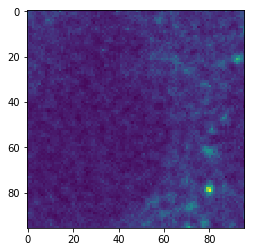

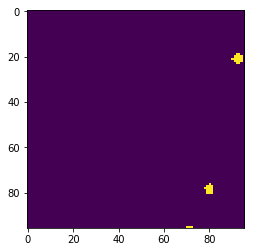

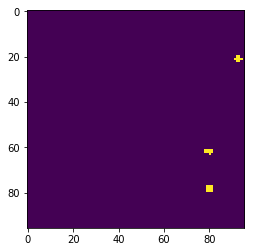

In [16]:
display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:image_size, :image_size, :image_size].reshape(1, 96, 96, 96, 1))
display_slice_from_batch(skimage.external.tifffile.imread("dataset/train/Frame2/truth.tif")[:image_size, :image_size, :image_size].reshape(1, 96, 96, 96, 1))
display_slice_from_batch(mask)
#With jul21_48_nonzero_standardized
#Model notes loss: standardized locally (per patch)
#With frame 2, it looks like intensity plays a big role

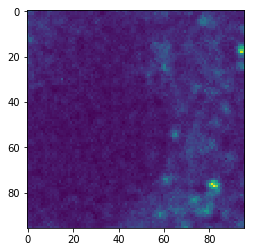

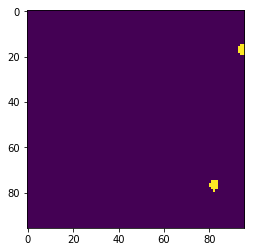

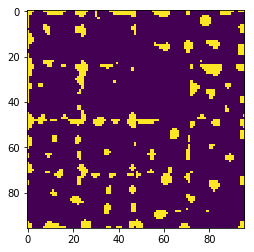

In [12]:
display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:image_size, :image_size, :image_size].reshape(1, 96, 96, 96, 1))
display_slice_from_batch(skimage.external.tifffile.imread("dataset/train/Frame35/truth.tif")[:image_size, :image_size, :image_size].reshape(1, 96, 96, 96, 1))
display_slice_from_batch(mask)
#With jul21_24_all (trained on everything)
#Model notes loss: -0.7611 on one epoch, val_loss = -0.801

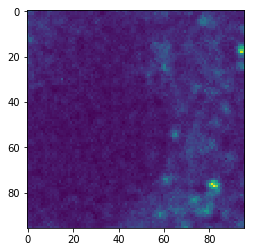

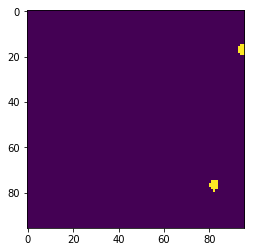

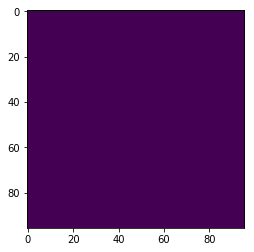

In [7]:
display_slice_from_batch(skimage.external.tifffile.imread(image_path)[:image_size, :image_size, :image_size].reshape(1, 96, 96, 96, 1))
display_slice_from_batch(skimage.external.tifffile.imread("dataset/train/Frame35/truth.tif")[:image_size, :image_size, :image_size].reshape(1, 96, 96, 96, 1))
display_slice_from_batch(mask)
#With jul21_32_all (trained on everything)
#Model notes (loss did not converge, ended at -0.0031, acc 93.23)

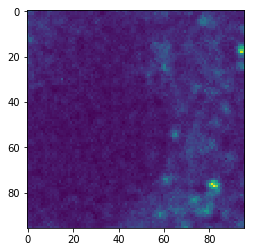

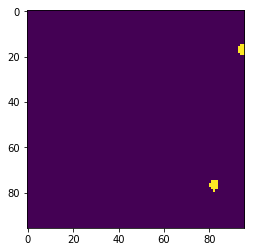

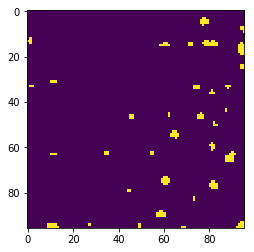

In [51]:
display_slice_from_batch(latticeMovieImage.reshape(1, 96, 96, 96, 1))
display_slice_from_batch(skimage.external.tifffile.imread("dataset/train/Frame35/truth.tif")[:image_size, :image_size, :image_size].reshape(1, 96, 96, 96, 1))
display_slice_from_batch(result)
#With 1200_model (trained on everything) 16 x 16 x 16 patches

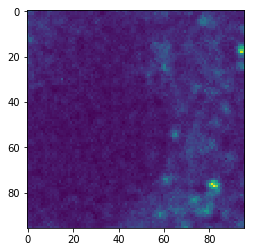

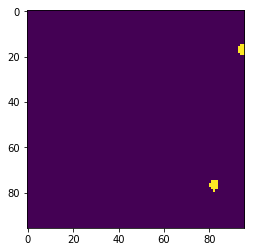

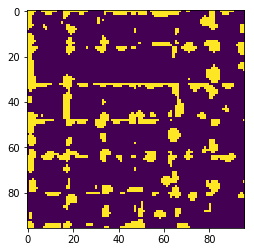

In [46]:
display_slice_from_batch(latticeMovieImage.reshape(1, 96, 96, 96, 1))
display_slice_from_batch(skimage.external.tifffile.imread("dataset/train/Frame35/truth.tif")[:image_size, :image_size, :image_size].reshape(1, 96, 96, 96, 1))
display_slice_from_batch(result)
#With 1150_model (trained on all nonzeroes)

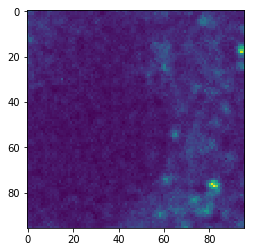

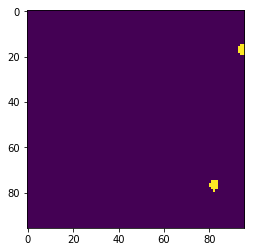

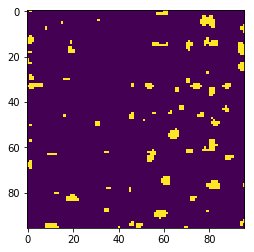

In [33]:
display_slice_from_batch(latticeMovieImage.reshape(1, 96, 96, 96, 1))
display_slice_from_batch(skimage.external.tifffile.imread("dataset/train/Frame35/truth.tif")[:image_size, :image_size, :image_size].reshape(1, 96, 96, 96, 1))
display_slice_from_batch(result)
#With best_model (initial, trained on 5 percent or greater) patch=16